## ATTRITION : 
The rate at which employees leave an organization over a particular period of time, when the company does not seek to fill the position.

### EMPLOYEE ATTRITION RATE :
Employee Attrition Rate is calculated as the percentage of employees who left the company in a given period to the total average number of employees within that period.

### AIM OF PROJECT:
To help a company understand the attrition in their organization to minimize the attrition rate, so that turnover costs are reduced and employees can be retained for a longer period.To explore the dataset and it's different features
Understand the relationship between the different varaibles
Find the variables that tend to have a larger number of employees with positive attrition

## Overview of project:
Exploratory data analysis of an attrition survey conducted.
Built a model to calculate the attrition rate in an organisation.

## Exploratory Data Analysis :
Exploratory Data Analysis is an initial process of analysis, in which we can summarize characteristics of data such as pattern, trends, outliers, and hypothesis testing using descriptive statistics and visualization.

## Import Dataset and Libraries

In [1]:
import matplotlib.pyplot as plt
import numpy as np
import warnings
warnings.filterwarnings("ignore")
import pandas as pd
import seaborn as sns

In [2]:
df = pd.read_csv("Attrition data.csv")

In [3]:
df

,EmployeeID,Age,Attrition,BusinessTravel,Department,DistanceFromHome,Education,EducationField,EmployeeCount,Gender,...,TotalWorkingYears,TrainingTimesLastYear,YearsAtCompany,YearsSinceLastPromotion,YearsWithCurrManager,EnvironmentSatisfaction,JobSatisfaction,WorkLifeBalance,JobInvolvement,PerformanceRating
0,1,51,No,Travel_Rarely,Sales,6,2,Life Sciences,1,Female,...,1.0,6,1,0,0,3.0,4.0,2.0,3,3
1,2,31,Yes,Travel_Frequently,Research & Development,10,1,Life Sciences,1,Female,...,6.0,3,5,1,4,3.0,2.0,4.0,2,4
2,3,32,No,Travel_Frequently,Research & Development,17,4,Other,1,Male,...,5.0,2,5,0,3,2.0,2.0,1.0,3,3
3,4,38,No,Non-Travel,Research & Development,2,5,Life Sciences,1,Male,...,13.0,5,8,7,5,4.0,4.0,3.0,2,3
4,5,32,No,Travel_Rarely,Research & Development,10,1,Medical,1,Male,...,9.0,2,6,0,4,4.0,1.0,3.0,3,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4405,4406,42,No,Travel_Rarely,Research & Development,5,4,Medical,1,Female,...,10.0,5,3,0,2,4.0,1.0,3.0,3,3
4406,4407,29,No,Travel_Rarely,Research & Development,2,4,Medical,1,Male,...,10.0,2,3,0,2,4.0,4.0,3.0,2,3
4407,4408,25,No,Travel_Rarely,Research & Development,25,2,Life Sciences,1,Male,...,5.0,4,4,1,2,1.0,3.0,3.0,3,4
4408,4409,42,No,Travel_Rarely,Sales,18,2,Medical,1,Male,...,10.0,2,9,7,8,4.0,1.0,3.0,2,3


## EDA on the Datasets

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4410 entries, 0 to 4409
Data columns (total 29 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   EmployeeID               4410 non-null   int64  
 1   Age                      4410 non-null   int64  
 2   Attrition                4410 non-null   object 
 3   BusinessTravel           4410 non-null   object 
 4   Department               4410 non-null   object 
 5   DistanceFromHome         4410 non-null   int64  
 6   Education                4410 non-null   int64  
 7   EducationField           4410 non-null   object 
 8   EmployeeCount            4410 non-null   int64  
 9   Gender                   4410 non-null   object 
 10  JobLevel                 4410 non-null   int64  
 11  JobRole                  4410 non-null   object 
 12  MaritalStatus            4410 non-null   object 
 13  MonthlyIncome            4410 non-null   int64  
 14  NumCompaniesWorked      

In [5]:
df.isnull().sum()

EmployeeID                  0
Age                         0
Attrition                   0
BusinessTravel              0
Department                  0
DistanceFromHome            0
Education                   0
EducationField              0
EmployeeCount               0
Gender                      0
JobLevel                    0
JobRole                     0
MaritalStatus               0
MonthlyIncome               0
NumCompaniesWorked         19
Over18                      0
PercentSalaryHike           0
StandardHours               0
StockOptionLevel            0
TotalWorkingYears           9
TrainingTimesLastYear       0
YearsAtCompany              0
YearsSinceLastPromotion     0
YearsWithCurrManager        0
EnvironmentSatisfaction    25
JobSatisfaction            20
WorkLifeBalance            38
JobInvolvement              0
PerformanceRating           0
dtype: int64

There are no null entries in existing employee dataset.

In [6]:
df.describe()

,EmployeeID,Age,DistanceFromHome,Education,EmployeeCount,JobLevel,MonthlyIncome,NumCompaniesWorked,PercentSalaryHike,StandardHours,...,TotalWorkingYears,TrainingTimesLastYear,YearsAtCompany,YearsSinceLastPromotion,YearsWithCurrManager,EnvironmentSatisfaction,JobSatisfaction,WorkLifeBalance,JobInvolvement,PerformanceRating
count,4410.000000,4410.000000,4410.000000,4410.000000,4410.0,4410.000000,4410.000000,4391.000000,4410.000000,4410.0,...,4401.000000,4410.000000,4410.000000,4410.000000,4410.000000,4385.000000,4390.000000,4372.000000,4410.000000,4410.000000
mean,2205.500000,36.923810,9.192517,2.912925,1.0,2.063946,65029.312925,2.694830,15.209524,8.0,...,11.279936,2.799320,7.008163,2.187755,4.123129,2.723603,2.728246,2.761436,2.729932,3.153741
std,1273.201673,9.133301,8.105026,1.023933,0.0,1.106689,47068.888559,2.498887,3.659108,0.0,...,7.782222,1.288978,6.125135,3.221699,3.567327,1.092756,1.101253,0.706245,0.711400,0.360742
min,1.000000,18.000000,1.000000,1.000000,1.0,1.000000,10090.000000,0.000000,11.000000,8.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000,3.000000
25%,1103.250000,30.000000,2.000000,2.000000,1.0,1.000000,29110.000000,1.000000,12.000000,8.0,...,6.000000,2.000000,3.000000,0.000000,2.000000,2.000000,2.000000,2.000000,2.000000,3.000000
50%,2205.500000,36.000000,7.000000,3.000000,1.0,2.000000,49190.000000,2.000000,14.000000,8.0,...,10.000000,3.000000,5.000000,1.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000
75%,3307.750000,43.000000,14.000000,4.000000,1.0,3.000000,83800.000000,4.000000,18.000000,8.0,...,15.000000,3.000000,9.000000,3.000000,7.000000,4.000000,4.000000,3.000000,3.000000,3.000000
max,4410.000000,60.000000,29.000000,5.000000,1.0,5.000000,199990.000000,9.000000,25.000000,8.0,...,40.000000,6.000000,40.000000,15.000000,17.000000,4.000000,4.000000,4.000000,4.000000,4.000000


In [7]:
df_agg = df[['WorkLifeBalance','JobSatisfaction','EnvironmentSatisfaction','TotalWorkingYears','NumCompaniesWorked']].agg(['min','max','median'])
df_agg

,WorkLifeBalance,JobSatisfaction,EnvironmentSatisfaction,TotalWorkingYears,NumCompaniesWorked
min,1.0,1.0,1.0,0.0,0.0
max,4.0,4.0,4.0,40.0,9.0
median,3.0,3.0,3.0,10.0,2.0


In [8]:
for column in df_agg:
    value_counts = df[column].value_counts()
    print(f"Value counts for column '{column}':")
    print(value_counts)
    print()

Value counts for column 'WorkLifeBalance':
3.0    2660
2.0    1019
4.0     454
1.0     239
Name: WorkLifeBalance, dtype: int64

Value counts for column 'JobSatisfaction':
4.0    1367
3.0    1323
1.0     860
2.0     840
Name: JobSatisfaction, dtype: int64

Value counts for column 'EnvironmentSatisfaction':
3.0    1350
4.0    1334
2.0     856
1.0     845
Name: EnvironmentSatisfaction, dtype: int64

Value counts for column 'TotalWorkingYears':
10.0    605
6.0     375
8.0     307
9.0     287
5.0     264
7.0     243
1.0     242
4.0     189
12.0    144
3.0     126
15.0    120
16.0    111
13.0    108
11.0    106
21.0    102
17.0     99
14.0     93
2.0      93
20.0     89
18.0     81
23.0     66
19.0     66
22.0     62
24.0     54
25.0     42
26.0     42
28.0     42
0.0      33
29.0     30
31.0     27
32.0     27
27.0     21
30.0     21
33.0     21
36.0     18
34.0     15
37.0     12
35.0      9
40.0      6
38.0      3
Name: TotalWorkingYears, dtype: int64

Value counts for column 'NumCompanie

In [9]:
df['JobSatisfaction'].fillna(df['JobSatisfaction'].median(), inplace=True)
df['WorkLifeBalance'].fillna(df['WorkLifeBalance'].median(), inplace=True)
df['EnvironmentSatisfaction'].fillna(df['EnvironmentSatisfaction'].median(), inplace=True)

In [10]:
df.columns

Index(['EmployeeID', 'Age', 'Attrition', 'BusinessTravel', 'Department',
       'DistanceFromHome', 'Education', 'EducationField', 'EmployeeCount',
       'Gender', 'JobLevel', 'JobRole', 'MaritalStatus', 'MonthlyIncome',
       'NumCompaniesWorked', 'Over18', 'PercentSalaryHike', 'StandardHours',
       'StockOptionLevel', 'TotalWorkingYears', 'TrainingTimesLastYear',
       'YearsAtCompany', 'YearsSinceLastPromotion', 'YearsWithCurrManager',
       'EnvironmentSatisfaction', 'JobSatisfaction', 'WorkLifeBalance',
       'JobInvolvement', 'PerformanceRating'],
      dtype='object')

## Column Description


#### Independent Variables were:
    
    Age: Age of employees,
    BusinessTravel:
    Department: Department of work,
    Distance from home,
    Education: 1-Below College; 2-College; 3-Bachelor; 4-Master; 5-Doctor;
    Education Field
    EmployeeCount
    Gender
    JobLevel
    JobRole
    Over18
    PercentSalaryHike
    StandardHours
    StockOptionLevel
    TotalWorkingYears
    TrainingTimesLastYear
    YearsSinceLastPromotion
    YearsWithCurrManager
    Environment Satisfaction: 1-Low; 2-Medium; 3-High; 4-Very High;
    Job Satisfaction: 1-Low; 2-Medium; 3-High; 4-Very High;
    JobInvolvement
    PerformanceRating
    Marital Status,
    Monthly Income,
    Num Companies Worked: Number of companies worked prior to IBM,
    Work Life Balance: 1-Bad; 2-Good; 3-Better; 4-Best;
    Years At Company: Current years of service in IBM
#### Dependent Variable was:
    
    Attrition: Employee attrition status(0 or 1)

## Top 5 values

In [11]:
df.head()

,EmployeeID,Age,Attrition,BusinessTravel,Department,DistanceFromHome,Education,EducationField,EmployeeCount,Gender,...,TotalWorkingYears,TrainingTimesLastYear,YearsAtCompany,YearsSinceLastPromotion,YearsWithCurrManager,EnvironmentSatisfaction,JobSatisfaction,WorkLifeBalance,JobInvolvement,PerformanceRating
0,1,51,No,Travel_Rarely,Sales,6,2,Life Sciences,1,Female,...,1.0,6,1,0,0,3.0,4.0,2.0,3,3
1,2,31,Yes,Travel_Frequently,Research & Development,10,1,Life Sciences,1,Female,...,6.0,3,5,1,4,3.0,2.0,4.0,2,4
2,3,32,No,Travel_Frequently,Research & Development,17,4,Other,1,Male,...,5.0,2,5,0,3,2.0,2.0,1.0,3,3
3,4,38,No,Non-Travel,Research & Development,2,5,Life Sciences,1,Male,...,13.0,5,8,7,5,4.0,4.0,3.0,2,3
4,5,32,No,Travel_Rarely,Research & Development,10,1,Medical,1,Male,...,9.0,2,6,0,4,4.0,1.0,3.0,3,3


## last 5 values

In [12]:
df.tail()

,EmployeeID,Age,Attrition,BusinessTravel,Department,DistanceFromHome,Education,EducationField,EmployeeCount,Gender,...,TotalWorkingYears,TrainingTimesLastYear,YearsAtCompany,YearsSinceLastPromotion,YearsWithCurrManager,EnvironmentSatisfaction,JobSatisfaction,WorkLifeBalance,JobInvolvement,PerformanceRating
4405,4406,42,No,Travel_Rarely,Research & Development,5,4,Medical,1,Female,...,10.0,5,3,0,2,4.0,1.0,3.0,3,3
4406,4407,29,No,Travel_Rarely,Research & Development,2,4,Medical,1,Male,...,10.0,2,3,0,2,4.0,4.0,3.0,2,3
4407,4408,25,No,Travel_Rarely,Research & Development,25,2,Life Sciences,1,Male,...,5.0,4,4,1,2,1.0,3.0,3.0,3,4
4408,4409,42,No,Travel_Rarely,Sales,18,2,Medical,1,Male,...,10.0,2,9,7,8,4.0,1.0,3.0,2,3
4409,4410,40,No,Travel_Rarely,Research & Development,28,3,Medical,1,Male,...,NaN,6,21,3,9,1.0,3.0,3.0,4,3


## Value counts of duplicate values

In [13]:
df.duplicated().value_counts()

False    4410
dtype: int64

###### There are No Duplicate Columns.

## Unique values of every columns

In [14]:
df.nunique()

EmployeeID                 4410
Age                          43
Attrition                     2
BusinessTravel                3
Department                    3
DistanceFromHome             29
Education                     5
EducationField                6
EmployeeCount                 1
Gender                        2
JobLevel                      5
JobRole                       9
MaritalStatus                 3
MonthlyIncome              1349
NumCompaniesWorked           10
Over18                        1
PercentSalaryHike            15
StandardHours                 1
StockOptionLevel              4
TotalWorkingYears            40
TrainingTimesLastYear         7
YearsAtCompany               37
YearsSinceLastPromotion      16
YearsWithCurrManager         18
EnvironmentSatisfaction       4
JobSatisfaction               4
WorkLifeBalance               4
JobInvolvement                4
PerformanceRating             2
dtype: int64

## Data Insights
###### In the given dataset, we have two types of employee one who stayed and another who left the company. 

## Attrition

In [15]:
att_count=pd.DataFrame(df["Attrition"].value_counts())
att_count

,Attrition
No,3699
Yes,711


## Distribution of Attrition 

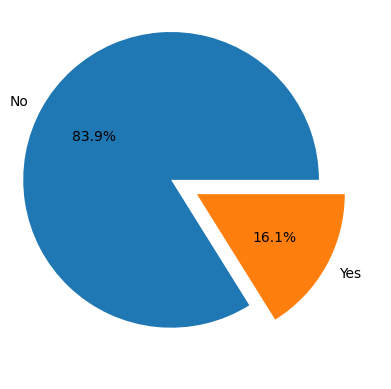

In [16]:
plt.pie(att_count["Attrition"],labels=['No','Yes'],autopct='%.1f%%', explode=(0.2,0))
plt.show()

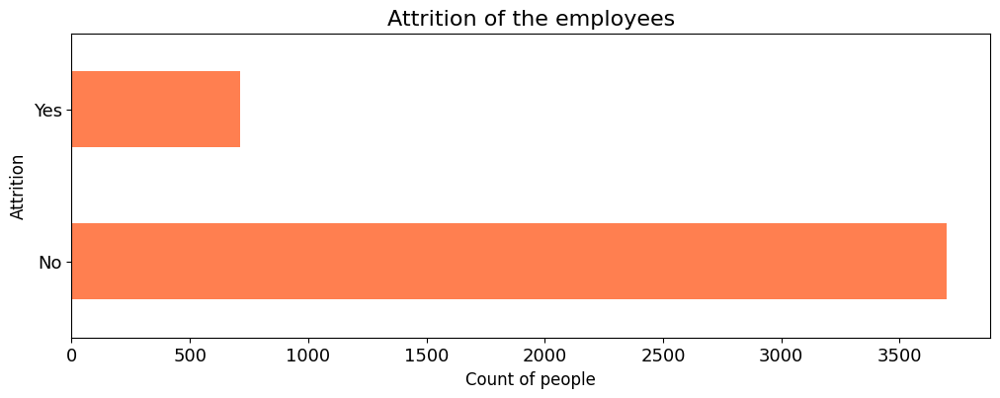

In [17]:
df['Attrition'].value_counts().plot(kind='barh', figsize=(12,4), color="coral", fontsize=13)

plt.xlabel("Count of people", fontsize=12)
plt.ylabel("Attrition", fontsize=12)
plt.title("Attrition of the employees", fontsize=16)
plt.show()

In [18]:
df.columns

Index(['EmployeeID', 'Age', 'Attrition', 'BusinessTravel', 'Department',
       'DistanceFromHome', 'Education', 'EducationField', 'EmployeeCount',
       'Gender', 'JobLevel', 'JobRole', 'MaritalStatus', 'MonthlyIncome',
       'NumCompaniesWorked', 'Over18', 'PercentSalaryHike', 'StandardHours',
       'StockOptionLevel', 'TotalWorkingYears', 'TrainingTimesLastYear',
       'YearsAtCompany', 'YearsSinceLastPromotion', 'YearsWithCurrManager',
       'EnvironmentSatisfaction', 'JobSatisfaction', 'WorkLifeBalance',
       'JobInvolvement', 'PerformanceRating'],
      dtype='object')

## Age and Attrition

In [19]:
#Number of Unique values

df["Age"].nunique()

43

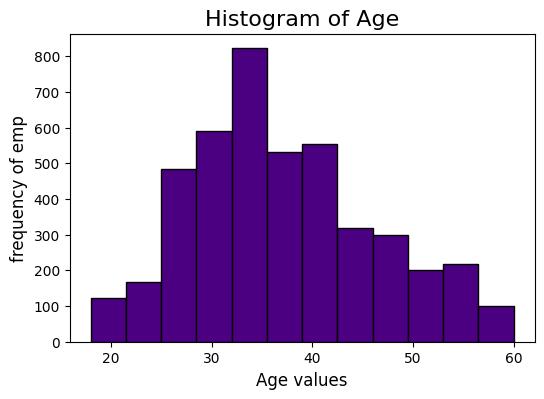

In [20]:
df.hist(column="Age",
         grid=False,
         figsize=(6,4),
         color="indigo",
         edgecolor="black",
         bins=12)

plt.xlabel("Age values",fontsize=12)
plt.ylabel("frequency of emp",fontsize=12)
plt.title("Histogram of Age",fontsize=16)

plt.show()

###### Most of the employees, who have been a part of the company, tend to fall in the age range from 25 years to 45 years. (68–95–99 rule)

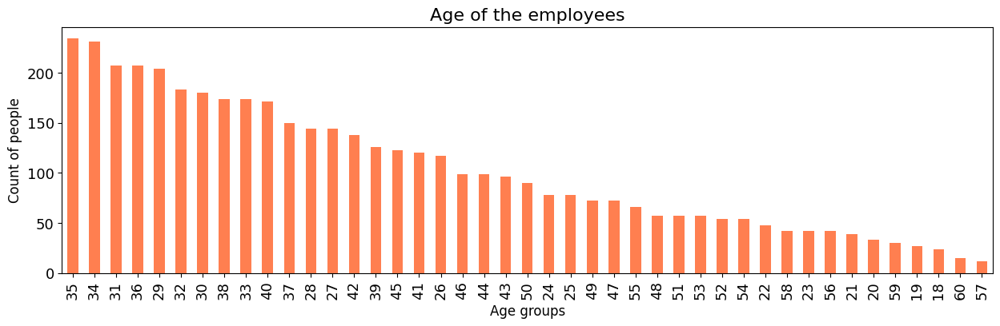

In [21]:
df['Age'].value_counts().plot(kind='bar', figsize=(15,4), color="coral", fontsize=13)

plt.xlabel("Age groups", fontsize=12)
plt.ylabel("Count of people", fontsize=12)
plt.title("Age of the employees", fontsize=16)
plt.show()

###### Maximum employees age lies in the range of 30 to 40

In [22]:
Att = pd.crosstab(df.Age,columns = df.Attrition)
Att

Attrition,No,Yes
Age,,
18,12,12
19,9,18
20,15,18
21,21,18
22,33,15
23,30,12
24,57,21
25,60,18
26,81,36


## What age group is more likely to leave?

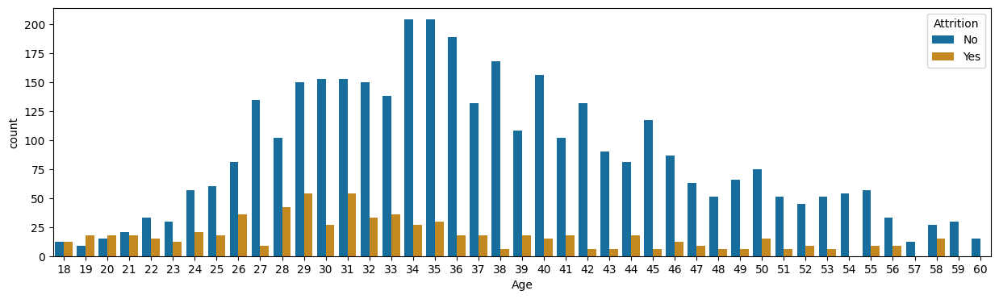

In [23]:
plt.subplots (figsize=(15,4))
sns.countplot (x='Age',  hue='Attrition', data= df, palette = 'colorblind')
plt.show()

###### The proportion of employees who left was comparatively less among the senior level employees. Maybe these employees were at a higher authority and were less likely to leave that position.



###### Major Attrition occured among the mid-career level employees. Career change and career growth could be one of the possibilities for such an attrition levels.

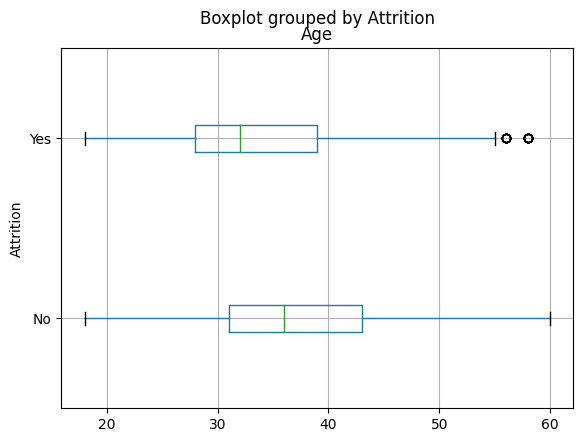

In [24]:
df.boxplot(column = 'Age', by = 'Attrition', vert= False)
plt.show()             
            

##### we can express that Age does not play a powerful role in influencing attrition  but In the above plot we can see that attrition count is higher in late 20 and early 30s.

## MonthlyIncome

In [29]:

pd.set_option('display.max_columns', None)
df.head()

,EmployeeID,Age,Attrition,BusinessTravel,Department,DistanceFromHome,Education,EducationField,EmployeeCount,Gender,JobLevel,JobRole,MaritalStatus,MonthlyIncome,NumCompaniesWorked,Over18,PercentSalaryHike,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,YearsAtCompany,YearsSinceLastPromotion,YearsWithCurrManager,EnvironmentSatisfaction,JobSatisfaction,WorkLifeBalance,JobInvolvement,PerformanceRating
0,1,51,No,Travel_Rarely,Sales,6,2,Life Sciences,1,Female,1,Healthcare Representative,Married,131160,1.0,Y,11,8,0,1.0,6,1,0,0,3.0,4.0,2.0,3,3
1,2,31,Yes,Travel_Frequently,Research & Development,10,1,Life Sciences,1,Female,1,Research Scientist,Single,41890,0.0,Y,23,8,1,6.0,3,5,1,4,3.0,2.0,4.0,2,4
2,3,32,No,Travel_Frequently,Research & Development,17,4,Other,1,Male,4,Sales Executive,Married,193280,1.0,Y,15,8,3,5.0,2,5,0,3,2.0,2.0,1.0,3,3
3,4,38,No,Non-Travel,Research & Development,2,5,Life Sciences,1,Male,3,Human Resources,Married,83210,3.0,Y,11,8,3,13.0,5,8,7,5,4.0,4.0,3.0,2,3
4,5,32,No,Travel_Rarely,Research & Development,10,1,Medical,1,Male,1,Sales Executive,Single,23420,4.0,Y,12,8,2,9.0,2,6,0,4,4.0,1.0,3.0,3,3


##### There are 4410 employees under our analysis for monthly income (in our sample)

• Ordinal data(numerical)

• The employees in the organization are earning from 10090 To 199,990.

• 25%(1st quartile) of the employees under our analysis in our sample are earning monthly salary less than or equal to 29110.

• 50%(median-2nd quartile) of the employees under our analysis in our sample are earning monthly salary less than or equal to 49190.

• 75%(3rd quartile) of the employees under our analysis in our sample are earning monthly salary less than or equal to 83800.

• The mean monthly income received by the employees are 65029.31.

In [31]:
df.MonthlyIncome.describe()

count      4410.000000
mean      65029.312925
std       47068.888559
min       10090.000000
25%       29110.000000
50%       49190.000000
75%       83800.000000
max      199990.000000
Name: MonthlyIncome, dtype: float64

In [32]:
df["MonthlyIncome"].nunique()

1349

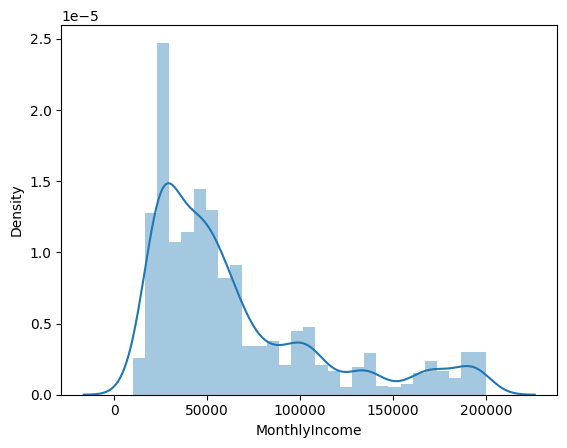

In [33]:
sns.distplot(df['MonthlyIncome']) 
plt.show()

##### This variable is left skewed distribution,meaning most of its values are located at the lower end(2000-6000)

In [34]:
p_attr = df.loc[df['Attrition'] == "Yes"]
n_attr = df.loc[df['Attrition'] == "No"]

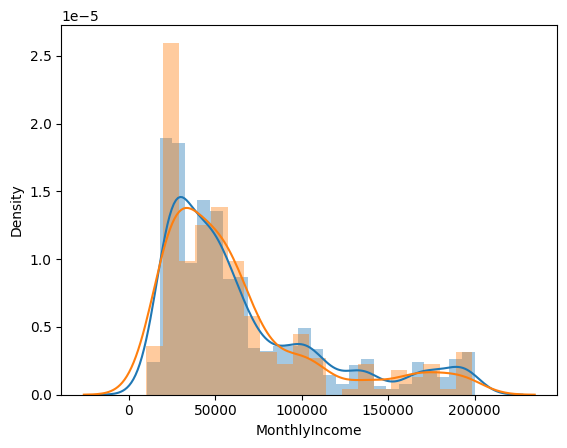

In [35]:
sns.distplot(n_attr['MonthlyIncome'], label='Negative attrition')
sns.distplot(p_attr['MonthlyIncome'], label='positive attrition')
plt.show()

##### There is high attrition rate among employees of relatively lower salary range, ie. less than 50000.

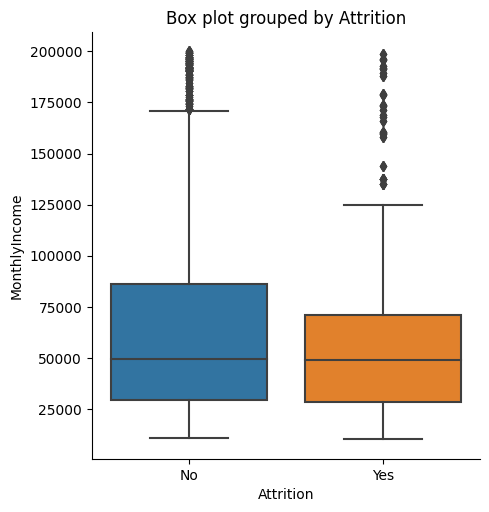

In [36]:
sns.catplot(x="Attrition",y="MonthlyIncome",kind="box",data=df)   
plt.title("Box plot grouped by Attrition")
plt.show()

##### There is high attrition rate among employees of relatively lower salary range, ie. less than 50000.

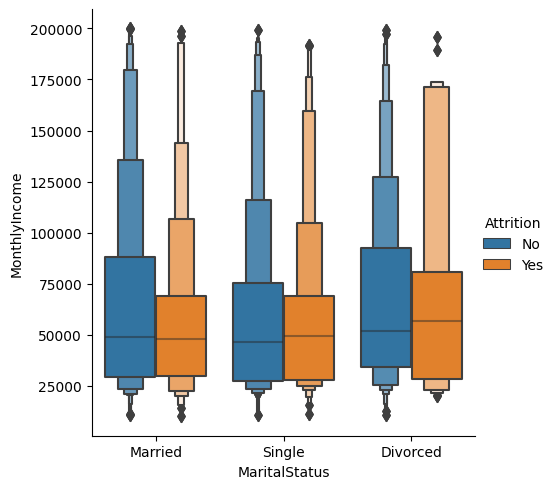

In [37]:
sns.catplot(x="MaritalStatus",y="MonthlyIncome",hue="Attrition" ,kind="boxen",data=df)   ##box graph
plt.show()

##### This will show monthly income and attrition using Marital Status category

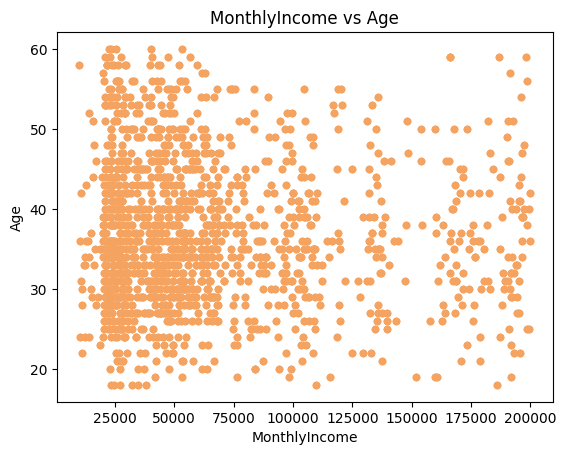

In [38]:
df.plot.scatter(x = 'MonthlyIncome', y = 'Age',
                  color = 'sandybrown', title = 'MonthlyIncome vs Age')
plt.show()

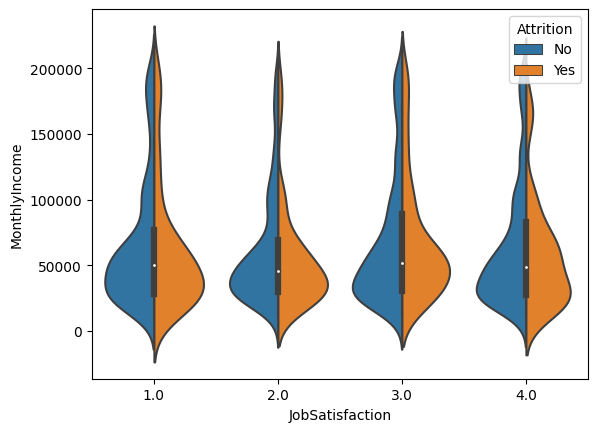

In [39]:
sns.violinplot(x ="JobSatisfaction", y ="MonthlyIncome", hue ="Attrition",
data = df, split = True)
plt.show()

## JobSatisfaction

 ##### There are 4410 employees under our analysis for Job Satisfaction (in our sample)

 Nominal data(categorical)

 There are 4 categories in this data sample: 1,2,3 and 4

 Here, 1 corresponds to least Job Satisfaction and 4 corresponds to the highest Job Satisfaction.

 The count analysis of the Job Satisfaction category:  4 1367  3 1343  1 860  2 840

 Highest rating is with ‘Job Satisfaction 4’ with a count of 1367.  Least rating is with ‘Job Satisfaction 1’ with a count of 840.

In [43]:
df["JobSatisfaction"].value_counts()   

4.0    1367
3.0    1343
1.0     860
2.0     840
Name: JobSatisfaction, dtype: int64

## Here JobSatisfaction Counts are shown by Graph

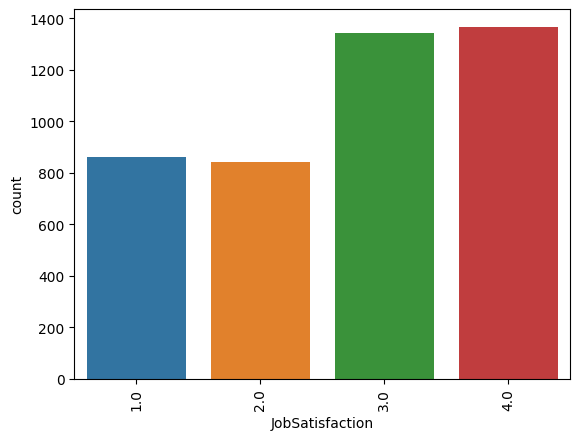

In [44]:
sns.countplot(x='JobSatisfaction', data=df)
plt.xticks(rotation=90)

plt.show()

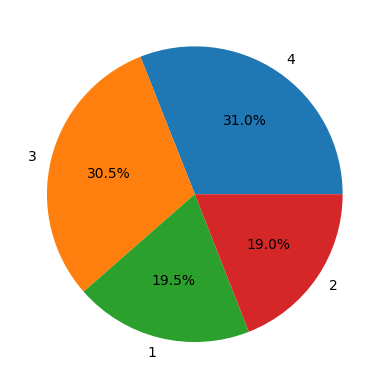

In [45]:
labels = ['4', '3','1','2']
plt.pie(df.JobSatisfaction.value_counts(), labels=labels, autopct='%.1f%%')
plt.show()

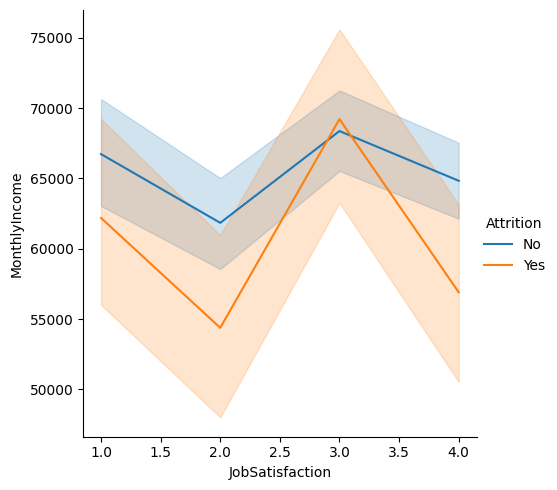

In [46]:
sns.relplot(x="JobSatisfaction",y="MonthlyIncome",hue="Attrition",kind="line",data=df)
plt.show()

## Department

• Nominal data(categorical)

• There are 3 categories in this data sample: Human Resources, Sales and Research & Development.

• The count of employees in these categories are: Human Resources = 189 Sales = 1338 Research and Development = 2883

• Under our analysis in the sample, 65.37% of the employees work in the Research and Development department, which is the maximum, 30.34% of the employees work in the Sales department and 4.28% of the employees work in the Human Resources department which is the least in the organization.

In [47]:
df["Department"].value_counts()

Research & Development    2883
Sales                     1338
Human Resources            189
Name: Department, dtype: int64

## Plot of different department

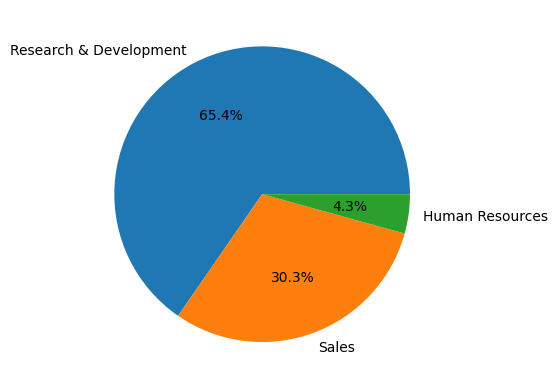

In [48]:
labels = ['Research & Development', 'Sales', 'Human Resources']
plt.pie(df.Department.value_counts(), labels=labels, autopct='%.1f%%')
plt.show()

In [49]:
t3 = pd.crosstab(df.Department,columns = df.Attrition)
t3

Attrition,No,Yes
Department,,
Human Resources,132,57
Research & Development,2430,453
Sales,1137,201


## Replace Attrition to numeric values

In [50]:
df['Attrition'] = df['Attrition'].replace({'Yes': 1, 'No': 0})

In [51]:
df.head()

,EmployeeID,Age,Attrition,BusinessTravel,Department,DistanceFromHome,Education,EducationField,EmployeeCount,Gender,JobLevel,JobRole,MaritalStatus,MonthlyIncome,NumCompaniesWorked,Over18,PercentSalaryHike,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,YearsAtCompany,YearsSinceLastPromotion,YearsWithCurrManager,EnvironmentSatisfaction,JobSatisfaction,WorkLifeBalance,JobInvolvement,PerformanceRating
0,1,51,0,Travel_Rarely,Sales,6,2,Life Sciences,1,Female,1,Healthcare Representative,Married,131160,1.0,Y,11,8,0,1.0,6,1,0,0,3.0,4.0,2.0,3,3
1,2,31,1,Travel_Frequently,Research & Development,10,1,Life Sciences,1,Female,1,Research Scientist,Single,41890,0.0,Y,23,8,1,6.0,3,5,1,4,3.0,2.0,4.0,2,4
2,3,32,0,Travel_Frequently,Research & Development,17,4,Other,1,Male,4,Sales Executive,Married,193280,1.0,Y,15,8,3,5.0,2,5,0,3,2.0,2.0,1.0,3,3
3,4,38,0,Non-Travel,Research & Development,2,5,Life Sciences,1,Male,3,Human Resources,Married,83210,3.0,Y,11,8,3,13.0,5,8,7,5,4.0,4.0,3.0,2,3
4,5,32,0,Travel_Rarely,Research & Development,10,1,Medical,1,Male,1,Sales Executive,Single,23420,4.0,Y,12,8,2,9.0,2,6,0,4,4.0,1.0,3.0,3,3


In [52]:
df.groupby('Department')['Attrition'].mean()

Department
Human Resources           0.301587
Research & Development    0.157128
Sales                     0.150224
Name: Attrition, dtype: float64

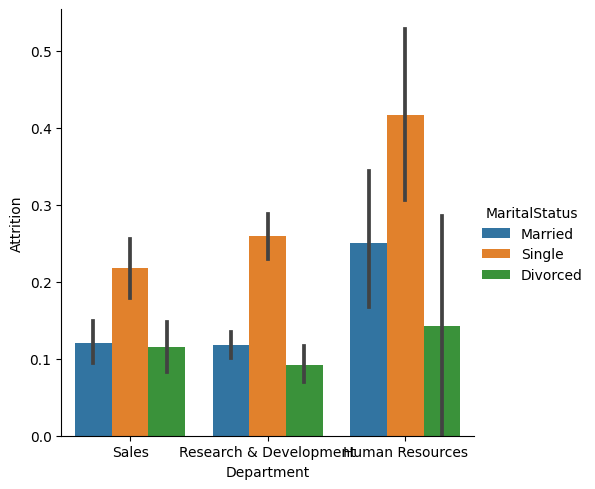

In [53]:
sns.catplot(x="Department",y="Attrition" ,hue="MaritalStatus",kind="bar",data=df)   
plt.show()

##### Employees in R&D department seem to have less attrition rate among other department employees, with higher attrition in both Human Resources and Sales Department.

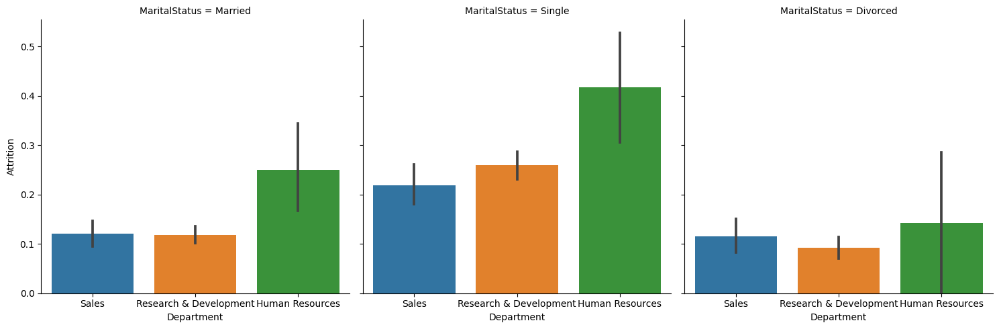

In [46]:
sns.catplot(x="Department",y="Attrition" ,col="MaritalStatus",kind="bar",data=df)   
plt.show()

##### when drilled down by Marital status, singles seem to have almost twice the attrition rate of  married employees  among all departments.

## Categorical plot between MonthlyIncome and Department and Attrition

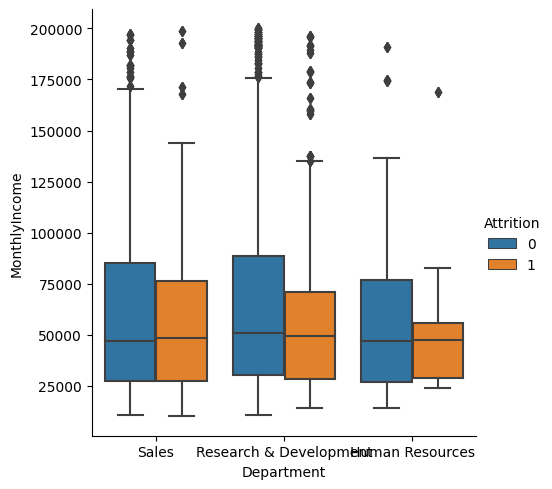

In [54]:
sns.catplot(x="Department",y="MonthlyIncome" ,hue="Attrition",kind="box",data=df)   
plt.show()

##### Here shows less income employee from human resources has more Attrition

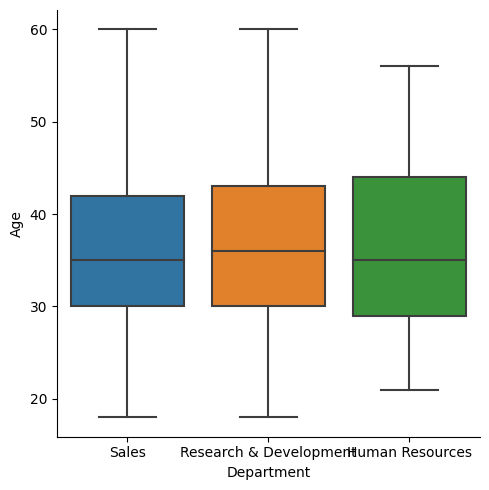

In [56]:
sns.catplot(x="Department",y="Age" ,kind="box",data=df)   
plt.show()

###### It shows relation between departments and age which normally distributed

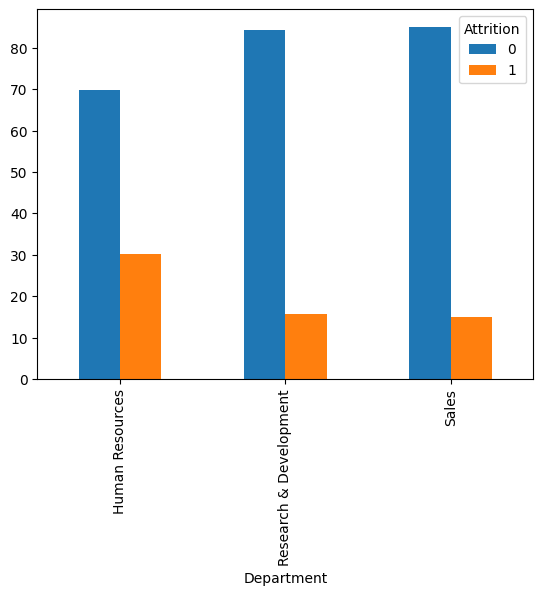

Attrition                       0          1
Department                                  
Human Resources         69.841270  30.158730
Research & Development  84.287201  15.712799
Sales                   84.977578  15.022422


In [49]:
tab=pd.crosstab(df["Department"],df["Attrition"],normalize='index')*100

tab.plot(kind="bar")
plt.show()


print(tab)


## Education Field

• Nominal data(categorical)

• There are 6 categories in this data sample: Human Resources, Life sciences, Marketing, Medical, Other and Technical degree

• The count of employees from these educational backgrounds are: Human Resources = 81 Life Sciences = 1818 Marketing = 477 Medical = 1392 Technical Degree = 396 Other = 246

• Under our analysis in the sample, 41.22% of the employees are from life sciences educational background, which is the maximum, 31.56% of the employees are from medical educational background, 10.81% of the employees are from marketing educational background, 8.97% of the employees are from technical degree educational background, 5.57% of the employees are from other educational background, 1.83% of the employees are from Human Resources background, which is the least in the organization.

In [57]:
df["EducationField"].value_counts()

Life Sciences       1818
Medical             1392
Marketing            477
Technical Degree     396
Other                246
Human Resources       81
Name: EducationField, dtype: int64

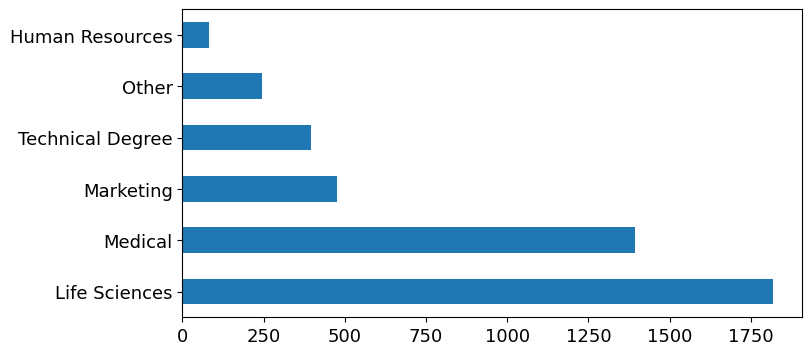

In [58]:
df["EducationField"].value_counts().plot(kind="barh",figsize=(8,4),fontsize=13)
plt.show()

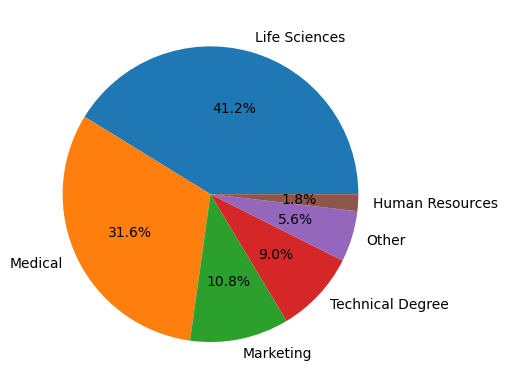

In [59]:
labels = ['Life Sciences', 'Medical', 'Marketing','Technical Degree','Other','Human Resources']
plt.pie(df.EducationField.value_counts(), labels=labels, autopct='%.1f%%')
plt.show()

In [60]:
t4 = pd.crosstab(df.EducationField,columns = df.Attrition)
t4

Attrition,0,1
EducationField,,
Human Resources,48,33
Life Sciences,1515,303
Marketing,402,75
Medical,1167,225
Other,216,30
Technical Degree,351,45


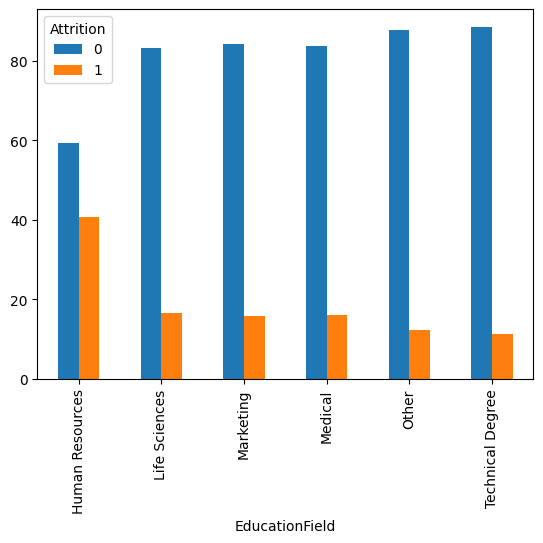

Attrition                 0          1
EducationField                        
Human Resources   59.259259  40.740741
Life Sciences     83.333333  16.666667
Marketing         84.276730  15.723270
Medical           83.836207  16.163793
Other             87.804878  12.195122
Technical Degree  88.636364  11.363636


In [61]:
tab=pd.crosstab(df["EducationField"],df["Attrition"],normalize='index')*100

tab.plot(kind="bar")
plt.show()


print(tab)

###### We can see that HR(25%),Marketing(22%),Technical(24%) education have attrition rates than the average of 16%. Hence we can say that these 3 education result in higher attrition

## Can low salary be one of the reasons?
###### Employees with Life Sciences, Medical and other educational background are leaving less as compared to HR,Marketing and Tech

#### Can low salary be a reason? let's find out

In [62]:
df.groupby('EducationField').MonthlyIncome.mean()

EducationField
Human Resources     60452.962963
Life Sciences       65311.831683
Marketing           59030.880503
Medical             67096.724138
Other               65761.463415
Technical Degree    64171.666667
Name: MonthlyIncome, dtype: float64

###### No,because even though the salary of HR and marketing employees is higher, their leaving rate is highest.

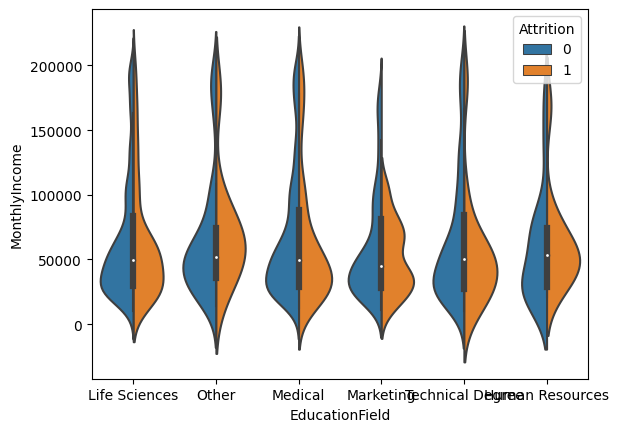

In [63]:
sns.violinplot(x ="EducationField", y ="MonthlyIncome", hue ="Attrition",
data = df, split = True)
plt.show()

## Subplot

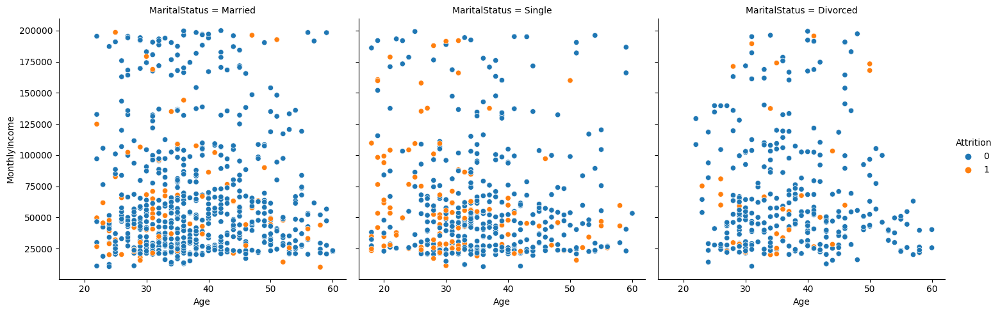

In [64]:
sns.relplot(x="Age",y="MonthlyIncome",hue="Attrition",col="MaritalStatus",data=df)   ##subplot
plt.show()

## Environmental Satisfaction

###### There are 4410 employees under our analysis for Environment Satisfaction (in our sample)

• Nominal data(categorical)

• There are 4 categories in this data sample: 1,2,3 and 4.

• Here, 1 corresponds to least environment satisfaction and 4 corresponds to the highest environment satisfaction.

• The count analysis of the Environment satisfaction category: • The employees who gave Environment satisfaction rating 1 is 845(19.34%) • The employees who gave Environment satisfaction rating 2 is 856 (19.52%) • The employees who gave Environment satisfaction rating 3 is 1375 (30.8%) • The employees who gave Environment satisfaction rating 4 is 1334 (30.34%)

 Most rating is with Environment satisfaction 3 with a count of 1375  Least rating is with Environment satisfaction 1 with a count of 845

In [68]:
#Number of Unique values
df["EnvironmentSatisfaction"].value_counts()

3.0    1375
4.0    1334
2.0     856
1.0     845
Name: EnvironmentSatisfaction, dtype: int64

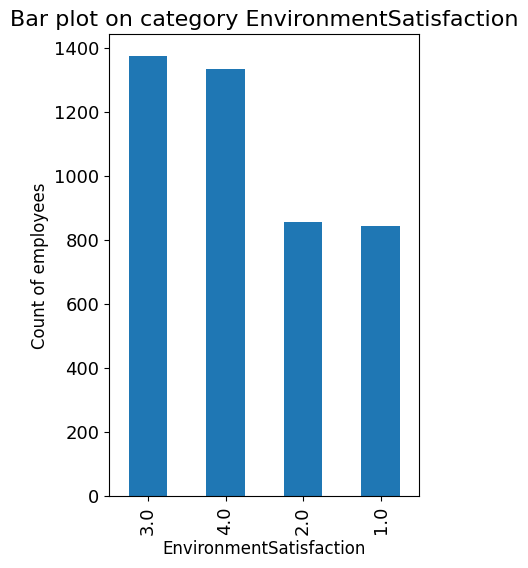

In [69]:
df["EnvironmentSatisfaction"].value_counts().plot(kind="bar",figsize=(4,6),fontsize=13)
plt.xlabel("EnvironmentSatisfaction", fontsize=12)
plt.ylabel("Count of employees", fontsize=12)
plt.title("Bar plot on category EnvironmentSatisfaction", fontsize=16)
plt.show()

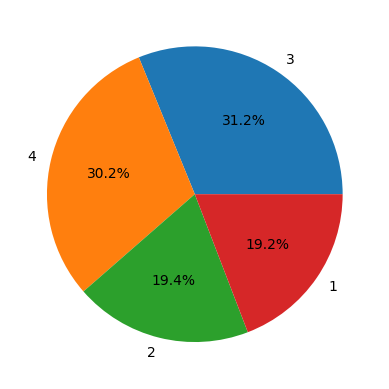

In [70]:
labels = ['3', '4', '2','1']
plt.pie(df.EnvironmentSatisfaction.value_counts(), labels=labels, autopct='%.1f%%')
plt.show()

In [71]:
t5 = pd.crosstab(df.EnvironmentSatisfaction,columns = df.Attrition)
t5

Attrition,0,1
EnvironmentSatisfaction,,
1.0,632,213
2.0,728,128
3.0,1184,191
4.0,1155,179


## percentage of EnvironmentSatisfaction numbers using attrition

Attrition                        0          1
EnvironmentSatisfaction                      
1.0                      74.792899  25.207101
2.0                      85.046729  14.953271
3.0                      86.109091  13.890909
4.0                      86.581709  13.418291


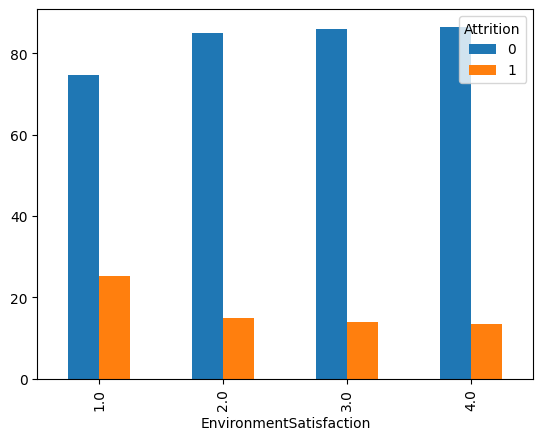

In [72]:
tab = pd.crosstab(df["EnvironmentSatisfaction"],df["Attrition"],normalize='index')*100
print(tab)
tab.plot(kind='bar')
plt.show()

###### Here, we can see that people with low environmental score of 1 have higher attrition rate(25%) than the average attrition rate of 16%

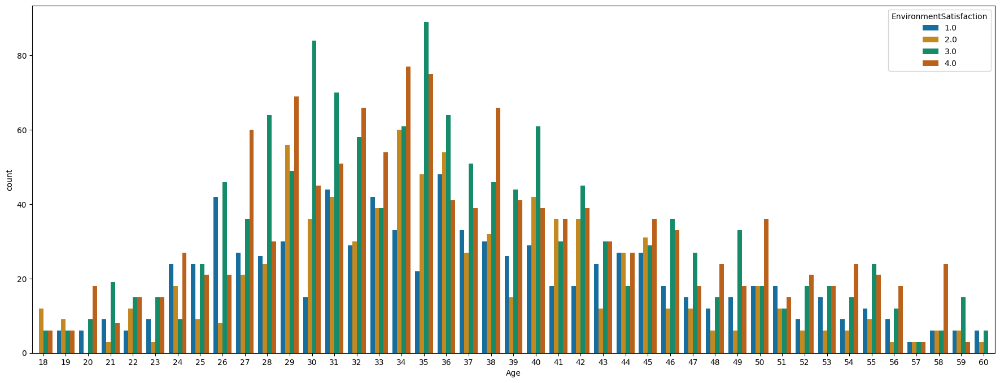

In [73]:
plt.subplots (figsize=(22,8))
sns.countplot (x='Age',  hue='EnvironmentSatisfaction', data= df, palette = 'colorblind')
plt.show()

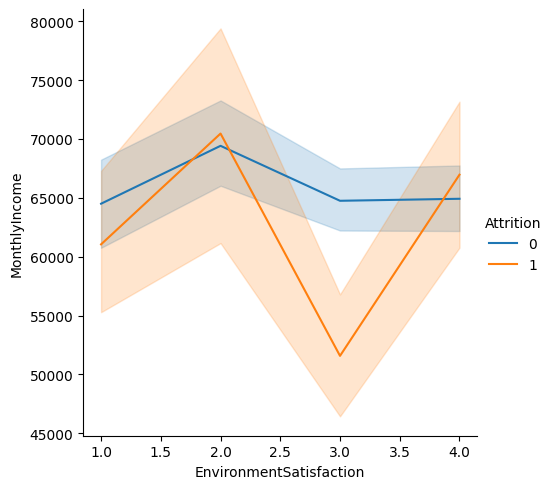

In [74]:
sns.relplot(x="EnvironmentSatisfaction",y="MonthlyIncome",hue="Attrition",kind="line",data=df)
plt.show()

## MaritalStatus

###### There are 4410 employees under our analysis for Marital Status (in our sample)

 Nominal data(categorical)

 There are 3 categories in this data sample: Single, Married and Divorced.

 The count analysis of the Marital Status category:  Married 2019  Single 1410  Divorced 981

• Employees with the “Married” status have maximum count in the given data set. • Employees with the “Divorced” status have minimum count in the given data set.

In [75]:
df["MaritalStatus"].value_counts()

Married     2019
Single      1410
Divorced     981
Name: MaritalStatus, dtype: int64

## Who is leaving more? married ,un-married or divorced employees?

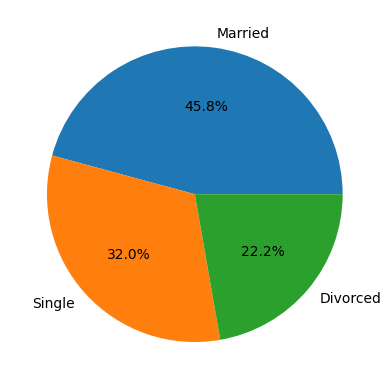

In [76]:
labels = ['Married', 'Single','Divorced']
plt.pie(df.MaritalStatus.value_counts(), labels=labels, autopct='%.1f%%')
plt.show()

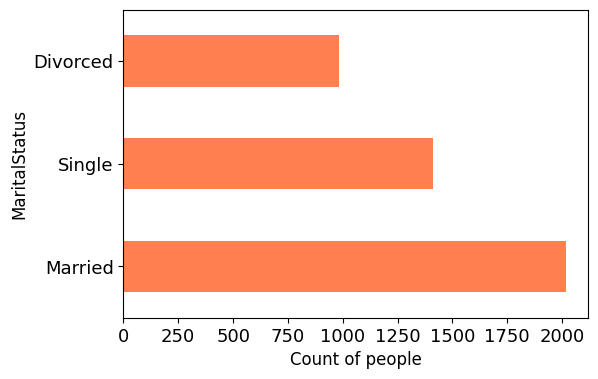

In [77]:
df['MaritalStatus'].value_counts().plot(kind='barh', figsize=(6,4), color="coral", fontsize=13)

plt.xlabel("Count of people", fontsize=12)
plt.ylabel("MaritalStatus", fontsize=12)

plt.show()

In [78]:
df.groupby('MaritalStatus').Attrition.mean()

MaritalStatus
Divorced    0.100917
Married     0.124814
Single      0.255319
Name: Attrition, dtype: float64

###### Singles tend to have a little higher attrition rate than others.

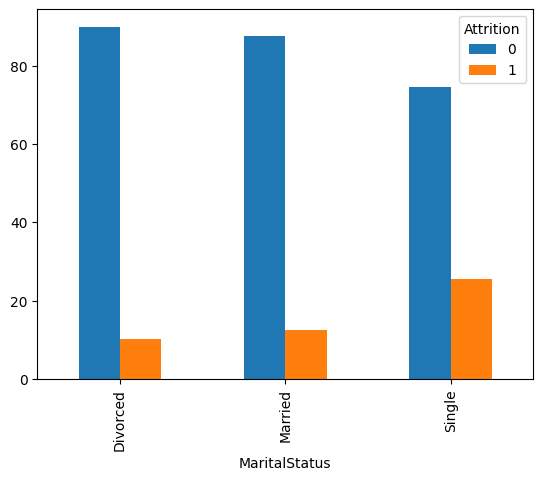

In [79]:
tab = pd.crosstab(df["MaritalStatus"],df["Attrition"],normalize='index')*100

tab.plot(kind='bar')
plt.show()

###### Single employee has high attrition rate(25%) compared to average attrition rate of 16%.Similarly, divorced employees have low attrition rate(10%) compared to the average of 16%.

## WorkLifeBalance

 ###### There are 4410 employees under our analysis for Work Life Balance(in our sample) • Nominal data(categorical)

• There are 4 categories in this data sample: 1,2,3 and 4.

• Here, 1 corresponds to least Work Life Balance and 4 corresponds to the highest Work Life Balance.

• The count analysis of the Work Life Balance category: • The employees who gave Work Life Balance rating 1 is 239 (5.44%) • The employees who gave Work Life Balance rating 2 is 1019 ( 23.40%) • The employees who gave Work Life Balance rating 3 is 2698 (60.07%) • The employees who gave Work Life Balance rating 4 is 454 (10.40%)

 Most rating is with Work Life Balance is 3 with a count of 2698  Least rating is with Work Life Balance 1 with a count of 239

In [80]:
df["WorkLifeBalance"].value_counts()

3.0    2698
2.0    1019
4.0     454
1.0     239
Name: WorkLifeBalance, dtype: int64

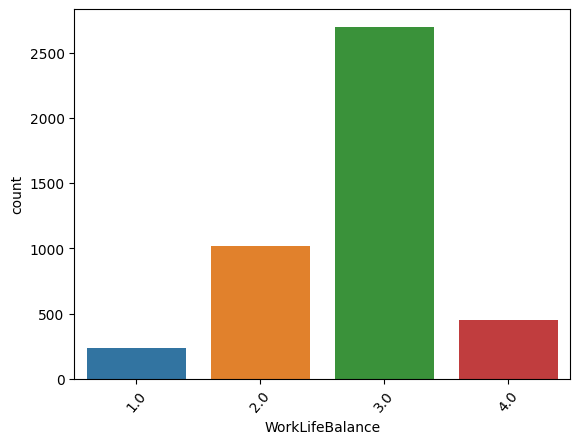

In [81]:
sns.countplot(x='WorkLifeBalance', data=df)

plt.xticks(rotation=50)
plt.show()

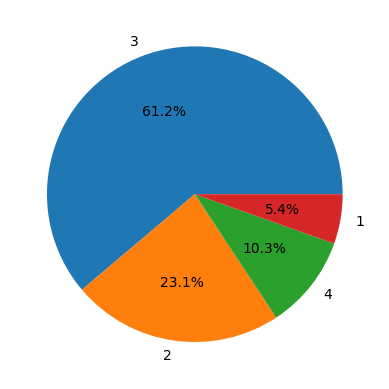

In [82]:
labels = ['3', '2','4','1']
plt.pie(df.WorkLifeBalance.value_counts(), labels=labels,autopct='%.1f%%')
plt.show()

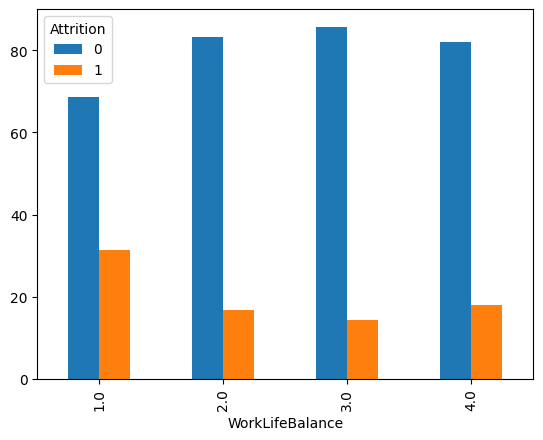

In [83]:
tab = pd.crosstab(df["WorkLifeBalance"],df["Attrition"],normalize='index')*100

tab.plot(kind='bar')
plt.show()

###### People with work life balance of 1 have high attrition rate(31%) compared to the population attrition rate of 16%.

###### Hence poor work life balance increases attrition.

## Years At Company

 
###### There are 4410 employees under our analysis for Years At Company (in our sample)
• Ordinal data(numerical)

• Range of Years At Company is between 0 years to 40 years: This company has employees across the spectrum from zero years experience till employees with 40 years of experience.

• Mean years in company of employees in the data sample is 7.008

• 25%(1st quartile) of the employees under our analysis in our sample are of years less than or equal to 3 years. • 50%(median-2nd quartile) of the employees under our analysis in our sample are of years less than or equal to 5. It provides the years ‘midpoint’ of employees of organization; there are the same number of people who are have more years than the median years. • 75%(3rd quartile) of the employees under our analysis in our sample have Years At Company less than or equal to 9.

• At least 75% of the employees under our analysis in our sample have Years At Company between 5.24(mean-2sd) and 19.24(mean+2sd)

• The maximum number(mode) of employees with years in the company under our analysis in our sample is 5 years.

• The minimum number of employees of the years in the company under our analysis in our sample are of age 1. (4 in number)

• The mean is greater than the median, so the distribution of variable mean will have its tail towards the right side. This indicates that the sample is positively skewed.

In [84]:
df.YearsAtCompany.describe()

count    4410.000000
mean        7.008163
std         6.125135
min         0.000000
25%         3.000000
50%         5.000000
75%         9.000000
max        40.000000
Name: YearsAtCompany, dtype: float64

## Are Employees leaving after working for certain number years?

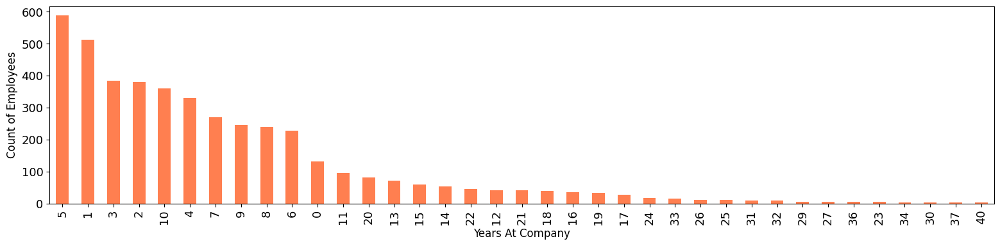

In [85]:
df['YearsAtCompany'].value_counts().plot(kind='bar', figsize=(19,4), color="coral", fontsize=13)

plt.xlabel("Years At Company", fontsize=12)
plt.ylabel("Count of Employees", fontsize=12)
plt.show()

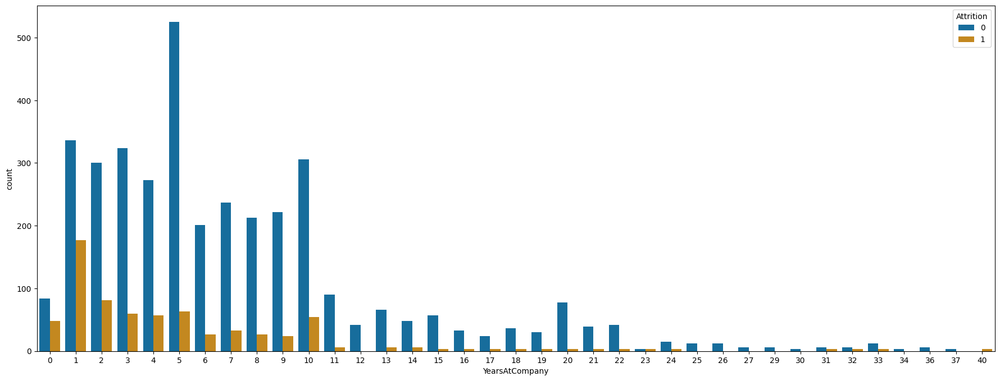

In [86]:
plt.subplots (figsize=(22,8))
sns.countplot (x='YearsAtCompany',  hue='Attrition', data= df, palette = 'colorblind')
plt.show()

# Gender

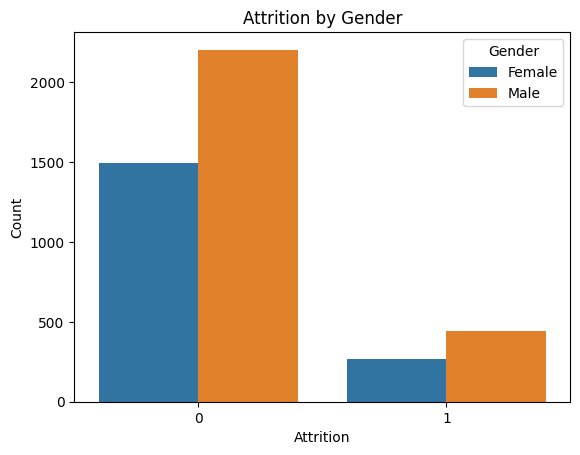

In [87]:
sns.countplot(x='Attrition', hue='Gender', data=df)
plt.title('Attrition by Gender')
plt.xlabel('Attrition')
plt.ylabel('Count')
plt.show()

In [88]:
df.head()

,EmployeeID,Age,Attrition,BusinessTravel,Department,DistanceFromHome,Education,EducationField,EmployeeCount,Gender,JobLevel,JobRole,MaritalStatus,MonthlyIncome,NumCompaniesWorked,Over18,PercentSalaryHike,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,YearsAtCompany,YearsSinceLastPromotion,YearsWithCurrManager,EnvironmentSatisfaction,JobSatisfaction,WorkLifeBalance,JobInvolvement,PerformanceRating
0,1,51,0,Travel_Rarely,Sales,6,2,Life Sciences,1,Female,1,Healthcare Representative,Married,131160,1.0,Y,11,8,0,1.0,6,1,0,0,3.0,4.0,2.0,3,3
1,2,31,1,Travel_Frequently,Research & Development,10,1,Life Sciences,1,Female,1,Research Scientist,Single,41890,0.0,Y,23,8,1,6.0,3,5,1,4,3.0,2.0,4.0,2,4
2,3,32,0,Travel_Frequently,Research & Development,17,4,Other,1,Male,4,Sales Executive,Married,193280,1.0,Y,15,8,3,5.0,2,5,0,3,2.0,2.0,1.0,3,3
3,4,38,0,Non-Travel,Research & Development,2,5,Life Sciences,1,Male,3,Human Resources,Married,83210,3.0,Y,11,8,3,13.0,5,8,7,5,4.0,4.0,3.0,2,3
4,5,32,0,Travel_Rarely,Research & Development,10,1,Medical,1,Male,1,Sales Executive,Single,23420,4.0,Y,12,8,2,9.0,2,6,0,4,4.0,1.0,3.0,3,3


# Business Travel

In [89]:
df['BusinessTravel'].value_counts()

Travel_Rarely        3129
Travel_Frequently     831
Non-Travel            450
Name: BusinessTravel, dtype: int64

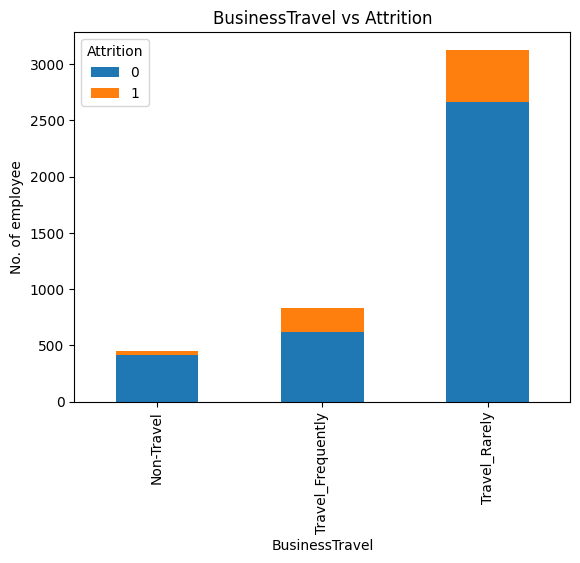

In [90]:
props = df.groupby('BusinessTravel')['Attrition'].value_counts().unstack()

props.plot(kind='bar', alpha=1,stacked = True )
plt.title('BusinessTravel vs Attrition')
plt.ylabel('No. of employee')
plt.show()

#### From the above data it is clear that Employees who travel rarely have more attrition rate followed by Employees who travel frequently

# JobLevel

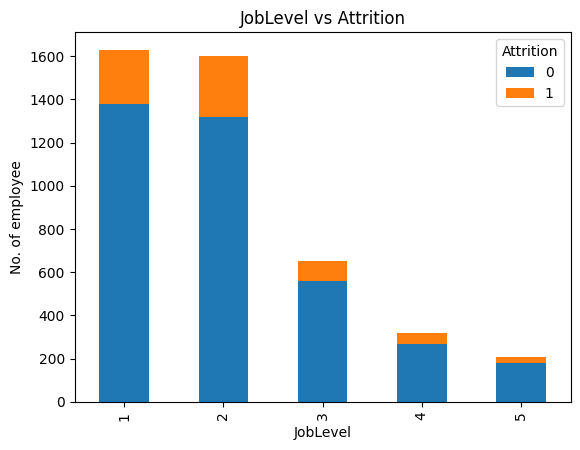

In [91]:
props = df.groupby('JobLevel')['Attrition'].value_counts().unstack()

props.plot(kind='bar', alpha=1,stacked = True )
plt.title('JobLevel vs Attrition')
plt.ylabel('No. of employee')
plt.show()

# JobRole

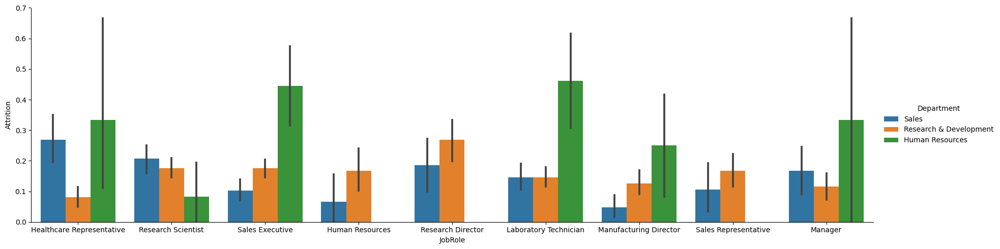

In [92]:
sns.catplot(x="JobRole",y="Attrition" ,hue="Department",kind="bar",data=df,height=5, aspect = 3.5)   
plt.show()

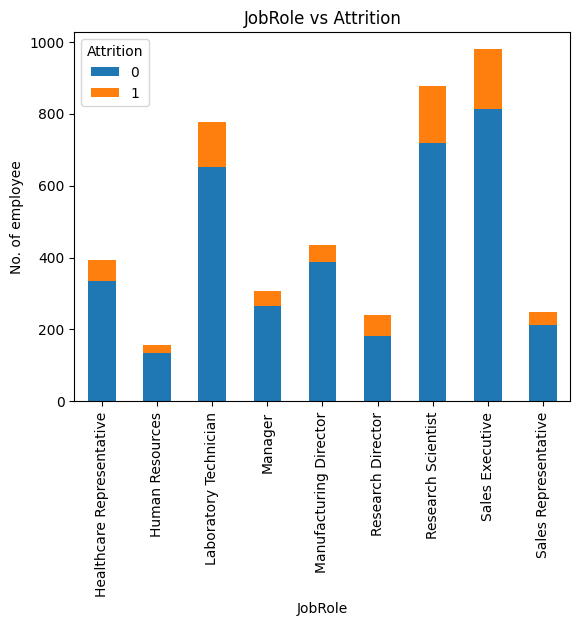

In [93]:
props = df.groupby('JobRole')['Attrition'].value_counts().unstack()

props.plot(kind='bar', alpha=1,stacked = True )
plt.title('JobRole vs Attrition')
plt.ylabel('No. of employee')
plt.show()

# TotalWorkingYears

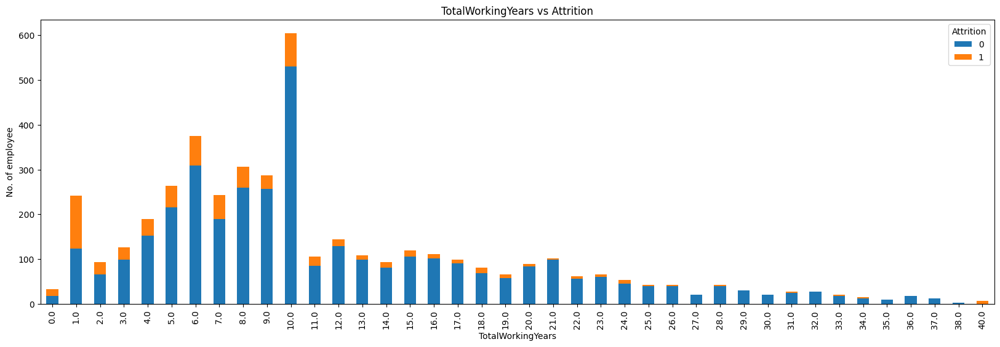

In [94]:
twy = df.groupby('TotalWorkingYears')['Attrition'].value_counts(normalize=False).unstack()

twy.plot(kind='bar',stacked = True,figsize=(20,6) )
plt.title('TotalWorkingYears vs Attrition')
plt.ylabel('No. of employee')
plt.show()

# YearsSinceLastPromotion

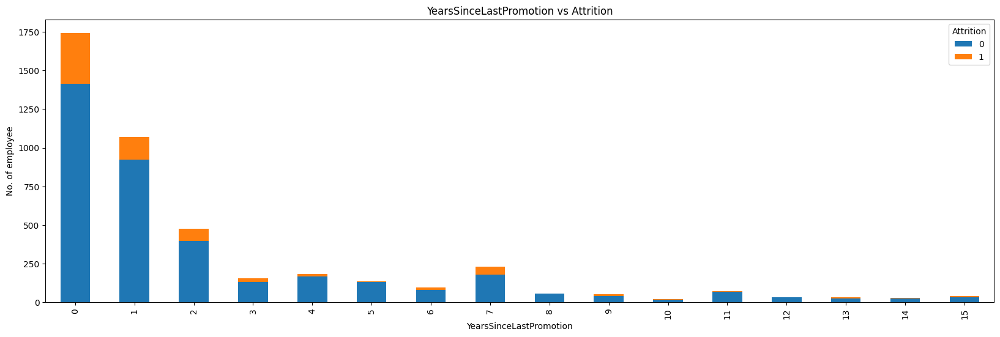

In [95]:
ysp = df.groupby('YearsSinceLastPromotion')['Attrition'].value_counts(normalize=False).unstack()

ysp.plot(kind='bar',stacked = True,figsize=(20,6) )
plt.title('YearsSinceLastPromotion vs Attrition')
plt.ylabel('No. of employee')
plt.show()

###### From the above plot it is very clear that Employees who are in same post or not getting promoted tend to leave the company most. It is a major concern, since experienced Employees quiting their jobs would impact the company most

# YearsWithCurrManager

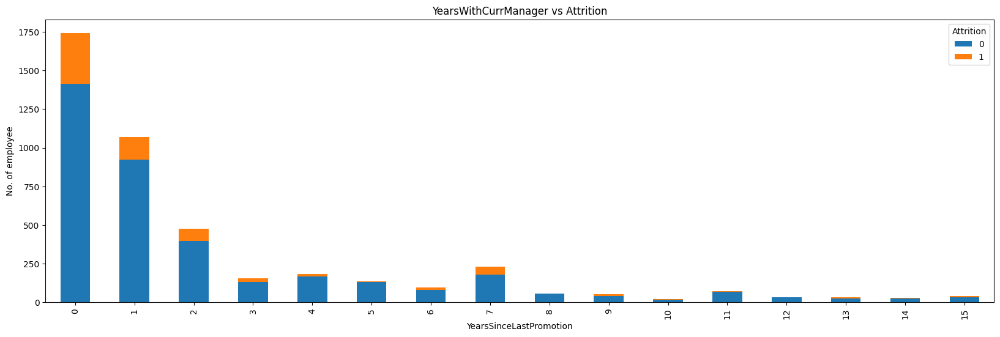

In [96]:
ycm = df.groupby('YearsWithCurrManager')['Attrition'].value_counts(normalize=False).unstack()

ysp.plot(kind='bar',stacked = True,figsize=(20,6) )
plt.title('YearsWithCurrManager vs Attrition')
plt.ylabel('No. of employee')
plt.show()

# JobInvolvement

In [97]:
df['JobInvolvement'].value_counts()

3    2604
2    1125
4     432
1     249
Name: JobInvolvement, dtype: int64

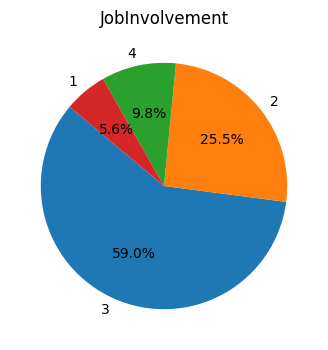

In [99]:
rating_counts = df['JobInvolvement'].value_counts()
labels = rating_counts.index.tolist()

plt.figure(figsize=(6, 4))
plt.pie(rating_counts, labels=labels, autopct='%1.1f%%', startangle=140)
plt.title('JobInvolvement')

plt.show()

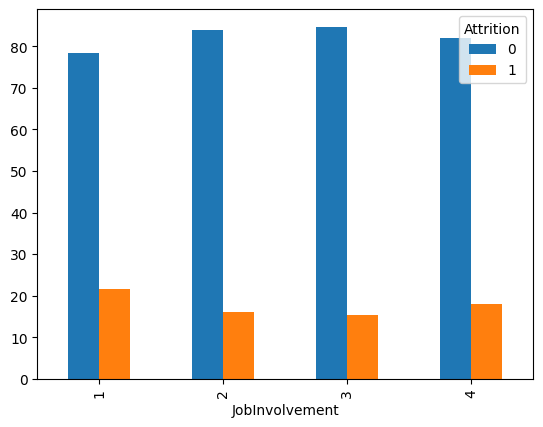

In [100]:
tab1 = pd.crosstab(df["JobInvolvement"],df["Attrition"],normalize='index')*100

tab1.plot(kind='bar')
plt.show()

# PerformanceRating

In [101]:
df['PerformanceRating'].value_counts()

3    3732
4     678
Name: PerformanceRating, dtype: int64

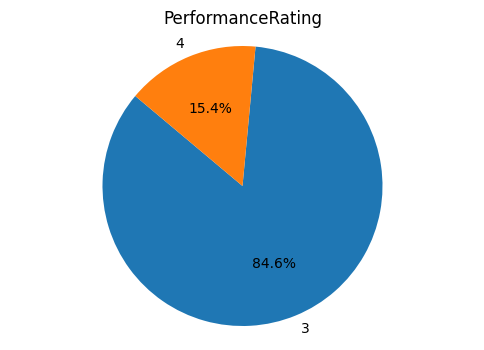

In [102]:
ratings = df['PerformanceRating'].value_counts()
labels = ratings.index.tolist()

plt.figure(figsize=(6, 4))
plt.pie(ratings, labels=labels, autopct='%1.1f%%', startangle=140)
plt.title('PerformanceRating')
plt.axis('equal')  
plt.show()

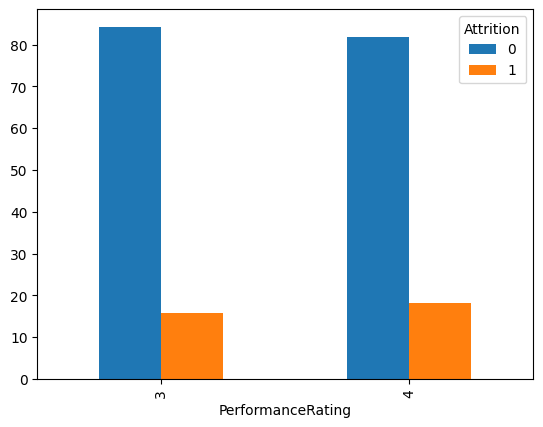

In [103]:
tab2 = pd.crosstab(df["PerformanceRating"],df["Attrition"],normalize='index')*100

tab2.plot(kind='bar')
plt.show()

##### Employees who have worked for less number of years tend to leave more.

## Distance From Home

###### There are 4410 employees under our analysis for ‘Distance from Home’ (in our sample). • Ordinal data(numerical)

• Range of ‘Distance from Home’ is between 1 to 29 km.

• Mean ‘Distance from Home’ of employees in the data sample is 9.19.

In [109]:
df.DistanceFromHome.describe()

count    4410.000000
mean        9.192517
std         8.105026
min         1.000000
25%         2.000000
50%         7.000000
75%        14.000000
max        29.000000
Name: DistanceFromHome, dtype: float64

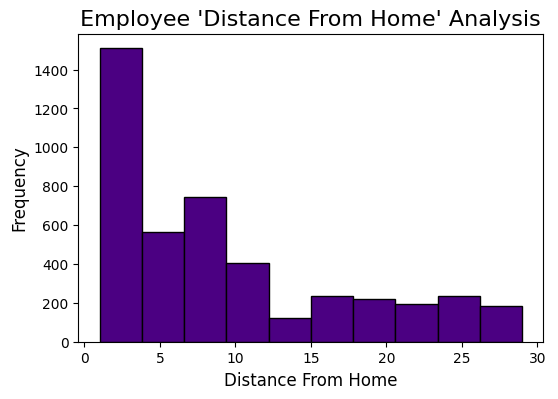

In [110]:
df.hist(column="DistanceFromHome",
         grid=False,
         figsize=(6,4),
         color="indigo",
         edgecolor="black",
         bins=10)

plt.xlabel("Distance From Home",fontsize=12)
plt.ylabel("Frequency",fontsize=12)
plt.title(" Employee 'Distance From Home' Analysis ",fontsize=16)

plt.show()

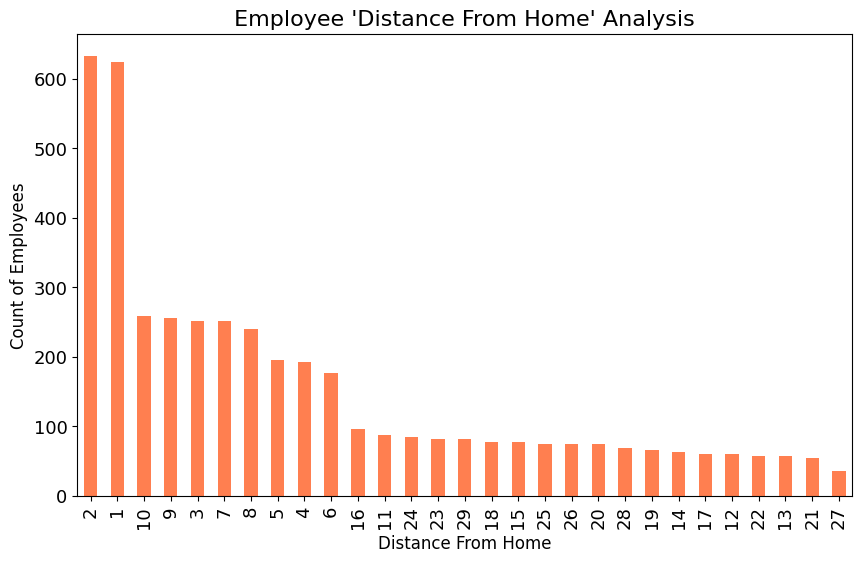

In [111]:
df['DistanceFromHome'].value_counts().plot(kind='bar', figsize=(10,6), color="coral", fontsize=13)

plt.xlabel("Distance From Home", fontsize=12)
plt.ylabel("Count of Employees", fontsize=12)
plt.title(" Employee 'Distance From Home' Analysis ", fontsize=16)
plt.show()

###### This graph shows most of the employees prefer to live closer to their home.

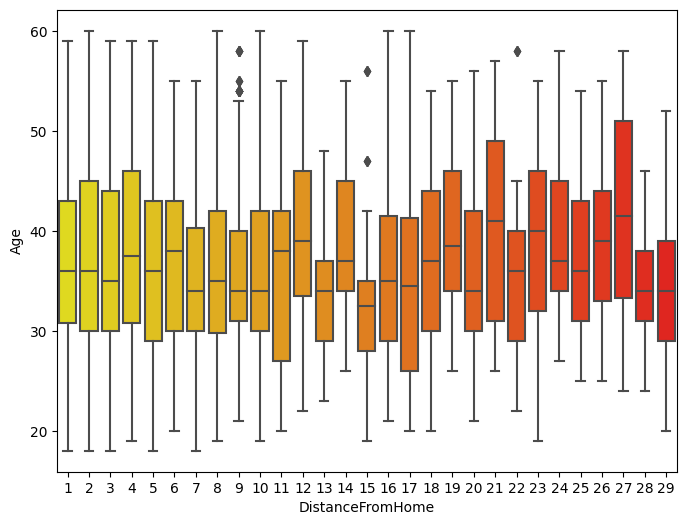

In [112]:
sns.boxplot(x = "DistanceFromHome",y= "Age",data = df, palette = "autumn_r")
plt.gcf().set_size_inches(8, 6)

###### This box plot shows DistanceFromHome with respect to age.It does not show any difference so it is normally distributed.

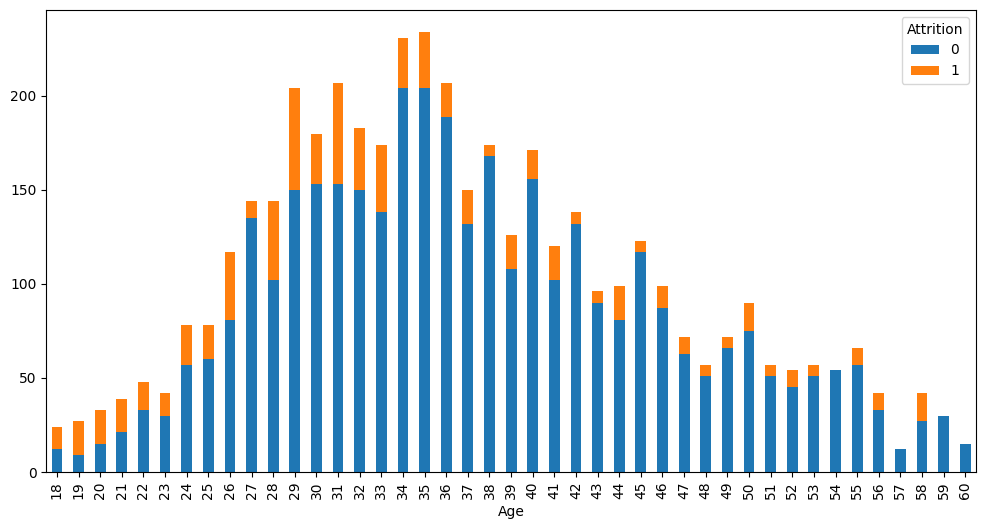

In [113]:
df.groupby(['Age','Attrition'])['DistanceFromHome'].size().unstack().plot(kind='bar', figsize=(12,6),stacked=True)
plt.show()

## Relation plot between Monthly Income and Age by Marital status

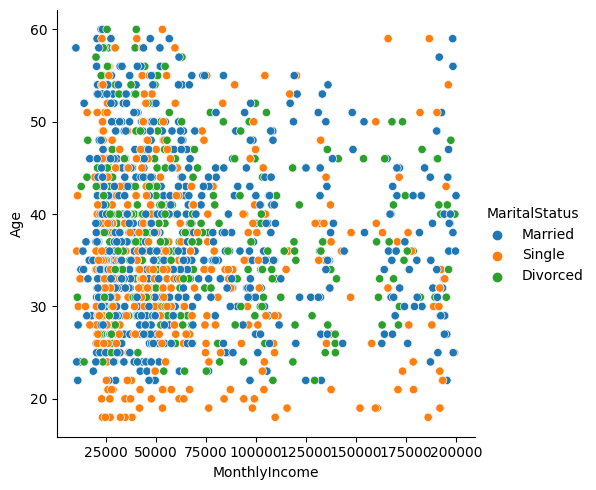

In [114]:
sns.relplot(x="MonthlyIncome",y="Age",hue="MaritalStatus",data=df)   
plt.show()                                        ##

### Relation between employee's  YearsAtCompany and their age with attrition

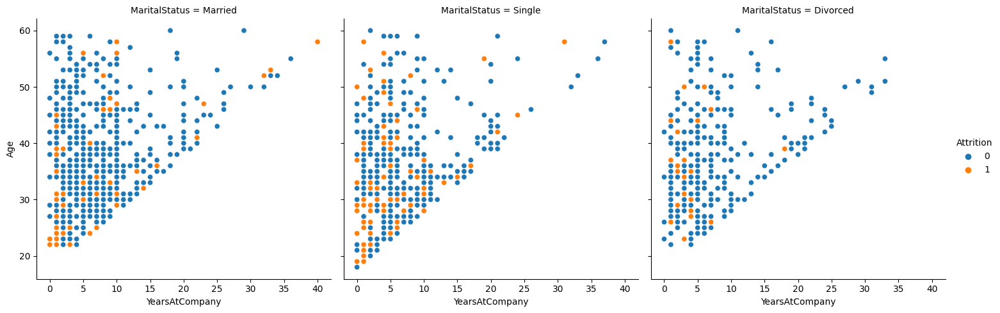

In [115]:
sns.relplot(x="YearsAtCompany",y="Age",hue="Attrition",col="MaritalStatus",data=df) ##diffrnt colm with diffn class
plt.show()

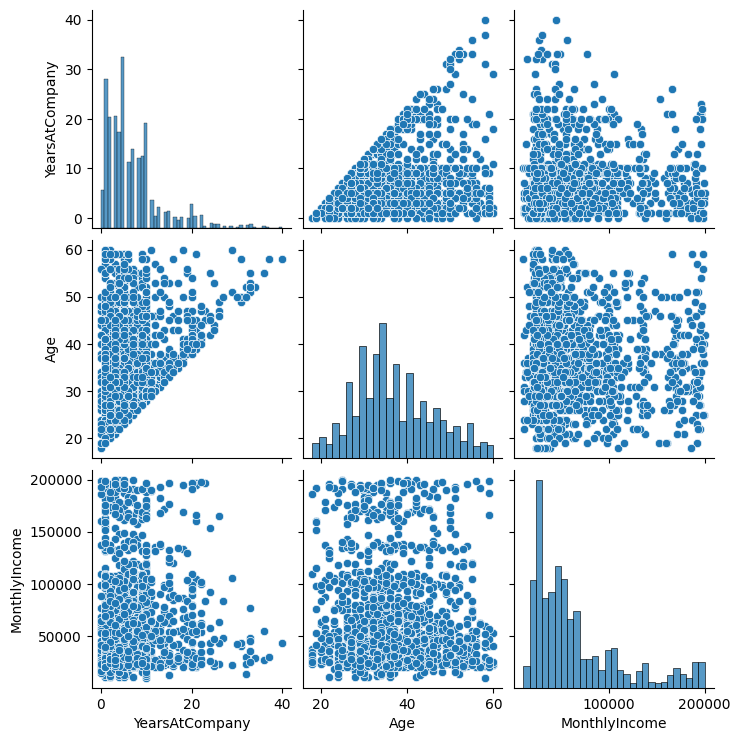

In [116]:
sns.pairplot(df, vars=["YearsAtCompany","Age","MonthlyIncome"])
plt.show()

 Here pair plot pairwise relationships in attrition dataset so that here all variables in attr will be plotted against each other variable in the dataset.

## Corelation

In [117]:
df.corr()

,EmployeeID,Age,Attrition,DistanceFromHome,Education,EmployeeCount,JobLevel,MonthlyIncome,NumCompaniesWorked,PercentSalaryHike,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,YearsAtCompany,YearsSinceLastPromotion,YearsWithCurrManager,EnvironmentSatisfaction,JobSatisfaction,WorkLifeBalance,JobInvolvement,PerformanceRating
EmployeeID,1.000000,0.008649,-0.004729,-0.001097,-0.009680,NaN,-0.003303,0.007338,-0.001117,-0.004456,NaN,-0.014254,-0.001063,-0.010191,0.004086,0.000256,0.008579,0.000455,-0.001024,-0.002164,0.008591,-0.006892
Age,0.008649,1.000000,-0.159205,0.006963,-0.035706,NaN,-0.002884,-0.044314,0.299243,-0.033137,NaN,-0.031753,0.680661,-0.027308,0.311309,0.216513,0.202089,0.009699,-0.003003,-0.020524,0.018196,-0.025563
Attrition,-0.004729,-0.159205,1.000000,-0.009730,-0.015111,NaN,-0.010290,-0.031176,0.042345,0.032533,NaN,-0.006839,-0.170338,-0.049431,-0.134392,-0.033019,-0.156199,-0.101625,-0.103068,-0.062975,-0.015588,0.023403
DistanceFromHome,-0.001097,0.006963,-0.009730,1.000000,-0.008638,NaN,-0.037329,-0.021607,-0.013843,0.038125,NaN,0.011169,0.009374,-0.009001,0.031684,0.002290,0.021584,0.020113,-0.011213,0.008305,-0.001837,0.036418
Education,-0.009680,-0.035706,-0.015111,-0.008638,1.000000,NaN,0.045746,0.006410,-0.016250,-0.040531,NaN,0.001261,-0.010717,0.010472,0.006080,0.022490,0.005358,-0.045636,-0.004612,-0.005610,-0.018279,-0.035591
EmployeeCount,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
JobLevel,-0.003303,-0.002884,-0.010290,-0.037329,0.045746,NaN,1.000000,0.047316,-0.009875,0.010973,NaN,0.000993,-0.036957,-0.032500,-0.064219,-0.060811,-0.055251,-0.024540,-0.018596,-0.027763,-0.012630,-0.002474
MonthlyIncome,0.007338,-0.044314,-0.031176,-0.021607,0.006410,NaN,0.047316,1.000000,-0.020726,0.004325,NaN,0.026930,-0.033787,0.050112,0.000995,0.065219,0.024304,-0.005747,0.004716,0.003705,0.023346,0.016093
NumCompaniesWorked,-0.001117,0.299243,0.042345,-0.013843,-0.016250,NaN,-0.009875,-0.020726,1.000000,0.030860,NaN,0.017163,0.238807,-0.032286,-0.117959,-0.036656,-0.109667,0.013157,-0.055830,-0.008906,0.027985,0.017819
PercentSalaryHike,-0.004456,-0.033137,0.032533,0.038125,-0.040531,NaN,0.010973,0.004325,0.030860,1.000000,NaN,0.012548,-0.018736,-0.037392,-0.029707,-0.029542,-0.040864,0.000850,0.030626,-0.040305,-0.004658,0.773550


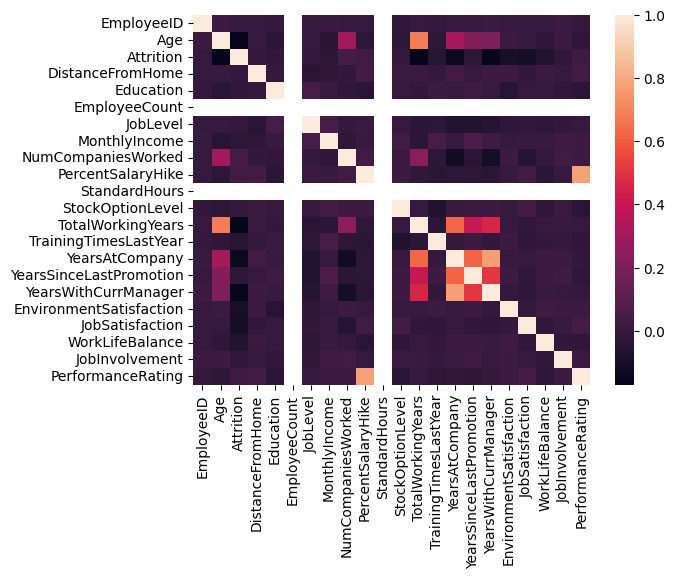

In [118]:

sns.heatmap(df.corr())               ###heatmap
plt.show()

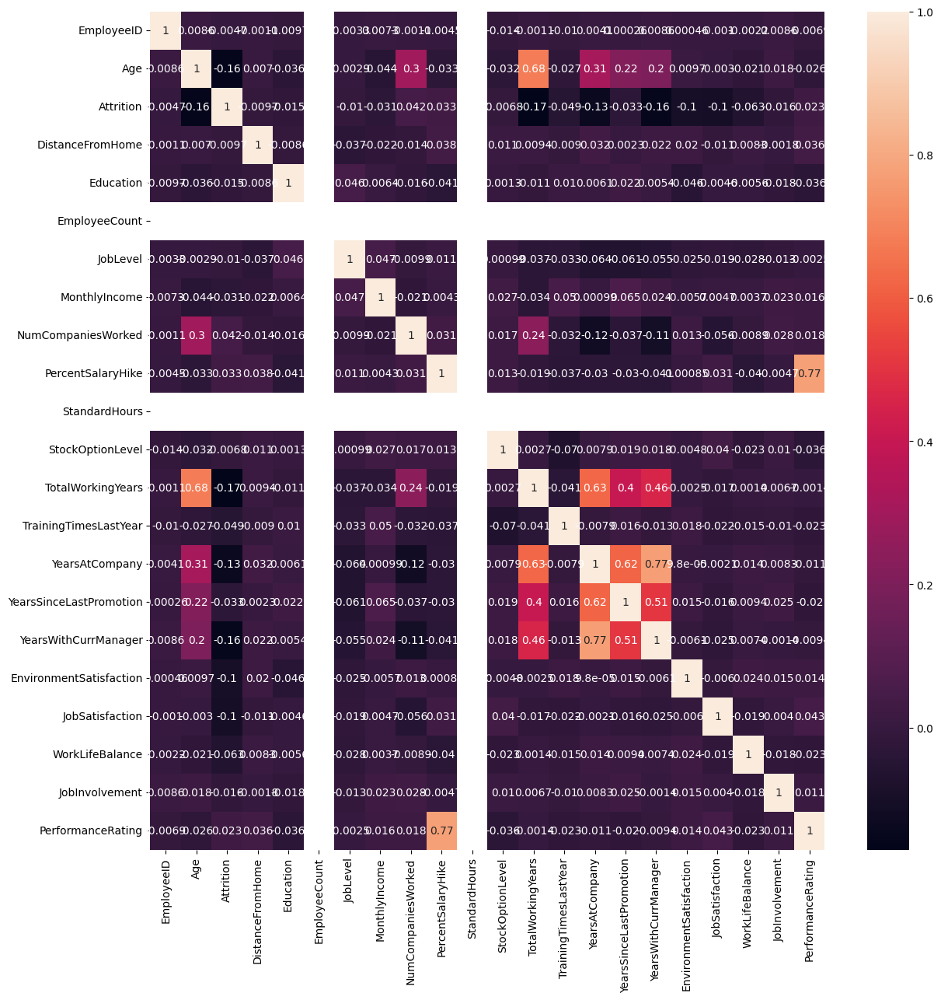

In [120]:
plt.figure(figsize = (14,14))
sns.heatmap(df.corr(), annot=True)               ###heatmap
plt.show()

Variables such as TotalWorkingYears, YearsAtCompany, YearsInCurrentRoleare highly corelated to each other.

This graph shows Pearson’s correlation values, and there is a presence of high correlations values among different sets of variables such as Monthly Income,  Total Working Hours and many more. 

'Years at Company' and 'Monthly Imcome': 0.51 -------> More experiece more salary

'Age' and 'Monthly Income': 0.49 --------> old employees have more experience

'Age' and 'Years at Company' : 0.31

'Age' and 'Number of Companies Worked': 0.29

'Work Life Balance', 'Job Satisfaction' and 'Environment Satisfaction' do not have strong correlation with other features

## pandas_profiling

In [118]:
from pandas_profiling import ProfileReport

In [119]:
profiling = ProfileReport(df)

In [120]:
profiling

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [121]:
profiling.to_file("df.html")

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

It will save profiling data in another file named attr.html

## Findings after performing Analysis :-
#### Based on Age:
Range of age is between 18 years to 60 years: This company has employees across the spectrum from recent graduates to the retirement age. Since the maximum age bracket with highest number of employees are between 30 -36, we can safely assume that the company prefers employees who have considerable work experience.

#### Based on Department:
Since 65% of the employees are in Research and development, we can assume that the company activities include innovation and introducing new products and services. Ostensibly, the goal of the company would be to take new products and services to market and add to the company's bottom line.

#### Based on Education Field:
Since 41% and 31% of the employees are from the Life sciences and medical backgrounds respectively, we can say that the company is majorly based out of bio-technology and R&D. This further strengthens our earlier propositions.

#### Based on Environment Satisfaction:
Since more than 60% of the employees have voted for the top 2 categories in environment satisfaction, we can say that the majority of employees feel comfortable working in this organization. However, 40% of the employees seem to need improvement in their working environment.

#### Based on Job Satisfaction:
Only 30% of employees in the organization have given the highest rating for job satisfaction. This shows that there is still a lot of room for improvement. 

#### Based on Marital Status:
As 45% of the employees in the organization are married, the company appears to give a stable and well-paying job profile to the employees. Marital status is also an important indicator of organisational commitment. Generally, married people are more committed to their organisation than unmarried people.

#### Based on Monthly Income:
It is negatively correlated to attrition. Lesser the Monthly Income, higher the attrition rate. Employees with salary around 2500 are more prone to leave the company.

#### Based on WorkLifeBalance :
60% of employees have given second best rating. This could again hint at a 'neutral response bias' and it involves a certain subjectivity of interpreting a correct work-life balance.

#### Based on Years At Company:
The dataset reveals that a majority of the employees (75%) have a work experience of less than 9 years at the company. There appears to be a tapering down of career progression above 10 years. If the company can positively tackle this, it can greatly benefit the organisation.

#### Based on Distance From Home:
A large number of employees are residing close to the company (50% of the employees are at a distance of 7km). There is a possibility that accomodation facilities are provided by the company, since the maximum count of employees are at a distance of 2 km.


## To reduce the attrition rate I would recommend:
Offer support: Provide work-life balance programs and flexible work arrangements that help employees manage their workload and reduce overtime. Offer mentorship and coaching programs that support employees in their current roles and help them develop the skills required for future roles.

Encourage career growth: Provide career advancement opportunities, training programs, and mentorship to support employee progression to higher job levels.

Offer competitive compensation: Offer competitive salaries and benefits that align with the market standards and recognize and reward long-serving employees for their commitment to the organization.

Foster a positive work environment: Provide a positive and inclusive work environment that encourages employee engagement and job satisfaction.

Gather employee feedback: Conduct regular employee engagement surveys to understand the underlying reasons for employee turnover and take corrective actions accordingly.